# 3 MACHINE  LEARNING FOR CLASSIFICATION   机器学习用于分类

### 客户流失项目
预测哪些客户即将流失，并给每位客户分配1个介于0到1之间的数值，以表示该客户的留存的可能性。
如果预测某些客户可能流失，我们会向他发送一些促销邮件，提供商品和服务的折扣。
同时我们不想给不会流失的客户提供折扣，因为那样会导致亏损。所以要做到预测的精准，才能保证折扣券发送的精准。
我们使用机器学习的二元分类方法来解决这个问题。

# 3.1  Churn prediction project   流失预测项目 & 下载数据

In [ ]:
#https://www.kaggle.com/blastchar/telco-customer-churn
# Install dependencies as needed:
# pip install kagglehub[pandas-datasets]
import kagglehub
from kagglehub import KaggleDatasetAdapter

# Set the path to the file you'd like to load
file_path = "WA_Fn-UseC_-Telco-Customer-Churn.csv"

# Load the latest version
df = kagglehub.load_dataset(
  KaggleDatasetAdapter.PANDAS,
  "blastchar/telco-customer-churn",
  file_path,
  # Provide any additional arguments like 
  # sql_query or pandas_kwargs. See the 
  # documenation for more information:
  # https://github.com/Kaggle/kagglehub/blob/main/README.md#kaggledatasetadapterpandas
)

print("First 5 records:", df.head())

# 3.2  数据准备  Data  Preparation

In [9]:
import pandas  as pd
import numpy as np
import matplotlib.pyplot as plt
df = pd.read_csv('WA_Fn-UseC_-Telco-Customer-Churn.csv') 
df 

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,6840-RESVB,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,...,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.5,No
7039,2234-XADUH,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.9,No
7040,4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No
7041,8361-LTMKD,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.6,Yes


In [2]:
df.dtypes.count()

np.int64(21)

In [6]:
df.head().T  # 哈哈哈，可以这样转置一下，让列成了行

,0,1,2,3,4
customerID,7590-VHVEG,5575-GNVDE,3668-QPYBK,7795-CFOCW,9237-HQITU
gender,Female,Male,Male,Male,Female
SeniorCitizen,0,0,0,0,0
Partner,Yes,No,No,No,No
Dependents,No,No,No,No,No
tenure,1,34,2,45,2
PhoneService,No,Yes,Yes,No,Yes
MultipleLines,No phone service,No,No,No phone service,No
InternetService,DSL,DSL,DSL,DSL,Fiber optic
OnlineSecurity,No,Yes,Yes,Yes,No


In [7]:
df.dtypes


customerID              str
gender                  str
SeniorCitizen         int64
Partner                 str
Dependents              str
tenure                int64
PhoneService            str
MultipleLines           str
InternetService         str
OnlineSecurity          str
OnlineBackup            str
DeviceProtection        str
TechSupport             str
StreamingTV             str
StreamingMovies         str
Contract                str
PaperlessBilling        str
PaymentMethod           str
MonthlyCharges      float64
TotalCharges            str
Churn                   str
dtype: object

In [12]:
df.columns

Index(['customerID', 'gender', 'SeniorCitizen', 'Partner', 'Dependents',
       'tenure', 'PhoneService', 'MultipleLines', 'InternetService',
       'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
       'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling',
       'PaymentMethod', 'MonthlyCharges', 'TotalCharges', 'Churn'],
      dtype='str')

In [8]:
df.columns = df.columns.str.lower().str.replace(' ','_')
df.columns

Index(['customerid', 'gender', 'seniorcitizen', 'partner', 'dependents',
       'tenure', 'phoneservice', 'multiplelines', 'internetservice',
       'onlinesecurity', 'onlinebackup', 'deviceprotection', 'techsupport',
       'streamingtv', 'streamingmovies', 'contract', 'paperlessbilling',
       'paymentmethod', 'monthlycharges', 'totalcharges', 'churn'],
      dtype='str')

In [9]:
df.dtypes[df.dtypes == 'str'].index  # 这里显示的结果，是个元组，需要把他转换成列表

Index(['customerid', 'gender', 'partner', 'dependents', 'phoneservice',
       'multiplelines', 'internetservice', 'onlinesecurity', 'onlinebackup',
       'deviceprotection', 'techsupport', 'streamingtv', 'streamingmovies',
       'contract', 'paperlessbilling', 'paymentmethod', 'totalcharges',
       'churn'],
      dtype='str')

In [10]:
categorical_columns = list(df.dtypes[df.dtypes == 'str'].index)  # 找到属性是‘str’的所有字段
categorical_columns

['customerid',
 'gender',
 'partner',
 'dependents',
 'phoneservice',
 'multiplelines',
 'internetservice',
 'onlinesecurity',
 'onlinebackup',
 'deviceprotection',
 'techsupport',
 'streamingtv',
 'streamingmovies',
 'contract',
 'paperlessbilling',
 'paymentmethod',
 'totalcharges',
 'churn']

In [11]:
for col in categorical_columns:
    df[col] = df[col].str.lower().str.replace(' ','_')

In [12]:
df.head()

,customerid,gender,seniorcitizen,partner,dependents,tenure,phoneservice,multiplelines,internetservice,onlinesecurity,...,deviceprotection,techsupport,streamingtv,streamingmovies,contract,paperlessbilling,paymentmethod,monthlycharges,totalcharges,churn
0,7590-vhveg,female,0,yes,no,1,no,no_phone_service,dsl,no,...,no,no,no,no,month-to-month,yes,electronic_check,29.85,29.85,no
1,5575-gnvde,male,0,no,no,34,yes,no,dsl,yes,...,yes,no,no,no,one_year,no,mailed_check,56.95,1889.5,no
2,3668-qpybk,male,0,no,no,2,yes,no,dsl,yes,...,no,no,no,no,month-to-month,yes,mailed_check,53.85,108.15,yes
3,7795-cfocw,male,0,no,no,45,no,no_phone_service,dsl,yes,...,yes,yes,no,no,one_year,no,bank_transfer_(automatic),42.30,1840.75,no
4,9237-hqitu,female,0,no,no,2,yes,no,fiber_optic,no,...,no,no,no,no,month-to-month,yes,electronic_check,70.70,151.65,yes


In [13]:
df.dtypes   # 这里要逐一检查每个字段的属性，看看是否合理，是否需要做处理
#  seniorcitizen  这是个内容就是0 和1，totalcharges  这个字段是字符串类型，应该是数值类型才对

customerid              str
gender                  str
seniorcitizen         int64
partner                 str
dependents              str
tenure                int64
phoneservice            str
multiplelines           str
internetservice         str
onlinesecurity          str
onlinebackup            str
deviceprotection        str
techsupport             str
streamingtv             str
streamingmovies         str
contract                str
paperlessbilling        str
paymentmethod           str
monthlycharges      float64
totalcharges            str
churn                   str
dtype: object

In [14]:
# 处理字段类型
tc = pd.to_numeric(df.totalcharges,errors='coerce')  
# 注意，除了把字段修改为数值类型，将无法转换的值强制转换为 NaN（缺失值）

In [15]:
type(tc)

pandas.Series

In [16]:
tc.isnull()

0       False
1       False
2       False
3       False
4       False
        ...  
7038    False
7039    False
7040    False
7041    False
7042    False
Name: totalcharges, Length: 7043, dtype: bool

In [17]:
df[tc.isnull()][['customerid','totalcharges'] ]   #  原始 DataFrame 中所有 TotalCharges 转换后为缺失值（NaN）的行,显示出来

,customerid,totalcharges
488,4472-lvygi,_
753,3115-czmzd,_
936,5709-lvoeq,_
1082,4367-nuyao,_
1340,1371-dwpaz,_
3331,7644-omvmy,_
3826,3213-vvolg,_
4380,2520-sgtta,_
5218,2923-arzlg,_
6670,4075-wkniu,_


In [18]:
df.totalcharges = pd.to_numeric(df.totalcharges,errors='coerce') # 处理这11行数值，先找出来，同时把列属性修改为数值类型

In [19]:
df.totalcharges.isnull().sum()  # 查看totalcharges的空值统计情况

np.int64(11)

In [20]:
# 然后空值填充0
df.totalcharges = df.totalcharges.fillna(0)

In [21]:
df.loc[df.index[[488, 753, 936, 1082, 1340, 3331, 3826, 4380, 5218, 6670, 6754]], 
       ['customerid', 'totalcharges']]  #查看填充后的效果。其实填充0肯定不是最合适的，先这样吧，alexey说这通常是可以的，然不是最佳

,customerid,totalcharges
488,4472-lvygi,0.0
753,3115-czmzd,0.0
936,5709-lvoeq,0.0
1082,4367-nuyao,0.0
1340,1371-dwpaz,0.0
3331,7644-omvmy,0.0
3826,3213-vvolg,0.0
4380,2520-sgtta,0.0
5218,2923-arzlg,0.0
6670,4075-wkniu,0.0


In [22]:
# 下面看流失率这个字段的情况
df.churn.head()    # 这里有问题，字段类型是str，内容是字符 ，yes  no  需要转换为1  0 

0     no
1     no
2    yes
3     no
4    yes
Name: churn, dtype: str

In [23]:
df.churn = (df.churn == 'yes').astype(int)   

In [24]:
# 检查数据集中的所有空值情况
print("=" * 50)  
print("快速检查:")
print("=" * 50)
print(df.isnull().sum())

快速检查:
customerid          0
gender              0
seniorcitizen       0
partner             0
dependents          0
tenure              0
phoneservice        0
multiplelines       0
internetservice     0
onlinesecurity      0
onlinebackup        0
deviceprotection    0
techsupport         0
streamingtv         0
streamingmovies     0
contract            0
paperlessbilling    0
paymentmethod       0
monthlycharges      0
totalcharges        0
churn               0
dtype: int64


In [25]:
df.dtypes

customerid              str
gender                  str
seniorcitizen         int64
partner                 str
dependents              str
tenure                int64
phoneservice            str
multiplelines           str
internetservice         str
onlinesecurity          str
onlinebackup            str
deviceprotection        str
techsupport             str
streamingtv             str
streamingmovies         str
contract                str
paperlessbilling        str
paymentmethod           str
monthlycharges      float64
totalcharges        float64
churn                 int64
dtype: object

# 3.3 配置验证框架 Setting up the validation framework  
Perform the train/validation/test split with Scikit-Learn  使用 Scikit-Learn 进行训练/验证/测试划分
使用cycler去配置搭建

In [26]:
from sklearn.model_selection import train_test_split  #导入库  

In [27]:
df_full_train,df_test = train_test_split(df, test_size=0.2, random_state=1)  # 设置 random_state=1，保证可复现的随机数

In [28]:
len(df_full_train),len(df_test)

(5634, 1409)

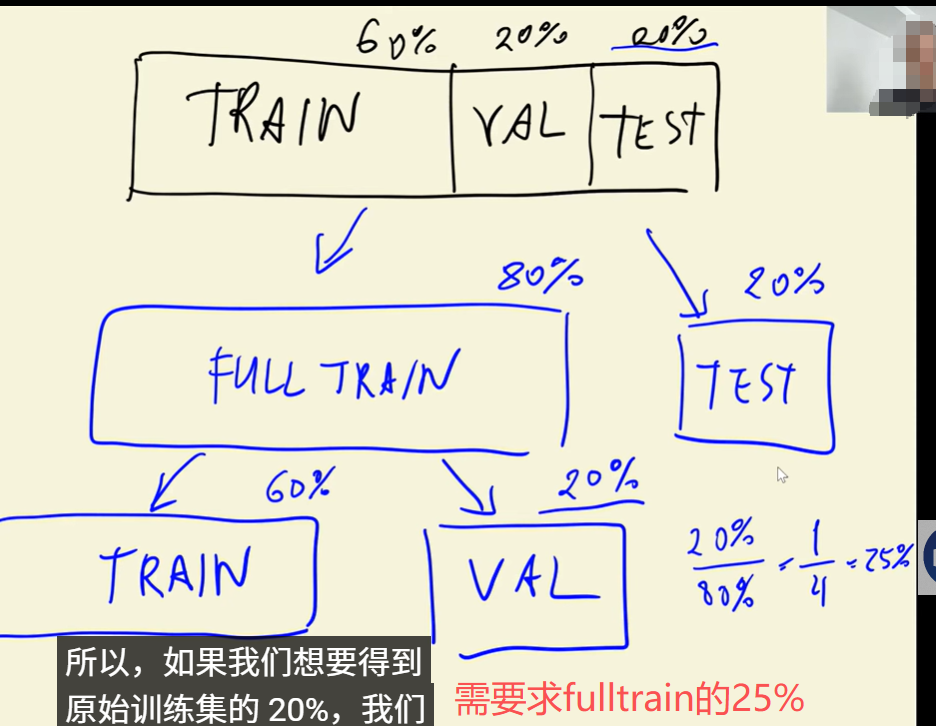

In [29]:
df_train,df_val = train_test_split(df_full_train, test_size=0.25, random_state=1)  # 设置 random_state=1，保证可复现的随机数

In [30]:
len(df_full_train),len(df_test),len(df_train),len(df_val)

(5634, 1409, 4225, 1409)

In [31]:
df_train = df_train.reset_index(drop=True)   #将上面划分数据打乱的索引，重建索引，并删除旧索引
df_val = df_val.reset_index(drop=True) 
df_test = df_test.reset_index(drop=True) 

In [32]:
# 求解三部分数据集的y值，numpy类型
y_train = df_train.churn.values 
y_val = df_val.churn.values 
y_test = df_test.churn.values 

In [33]:
# 删除三部分数据集的y值,防止y值在数据集被用作训练验证和测试时，被意外使用
del df_train['churn']
del df_val['churn']
del df_test['churn']

In [34]:
df_full_train
# 注意，这个数据集即没有索引重建，也没有删除y值，我们将在下一节中，看一这个目标变量（流失） Look at the target variable (churn) 

,customerid,gender,seniorcitizen,partner,dependents,tenure,phoneservice,multiplelines,internetservice,onlinesecurity,...,deviceprotection,techsupport,streamingtv,streamingmovies,contract,paperlessbilling,paymentmethod,monthlycharges,totalcharges,churn
1814,5442-pptjy,male,0,yes,yes,12,yes,no,no,no_internet_service,...,no_internet_service,no_internet_service,no_internet_service,no_internet_service,two_year,no,mailed_check,19.70,258.35,0
5946,6261-rcvns,female,0,no,no,42,yes,no,dsl,yes,...,yes,yes,no,yes,one_year,no,credit_card_(automatic),73.90,3160.55,1
3881,2176-osjuv,male,0,yes,no,71,yes,yes,dsl,yes,...,no,yes,no,no,two_year,no,bank_transfer_(automatic),65.15,4681.75,0
2389,6161-erdgd,male,0,yes,yes,71,yes,yes,dsl,yes,...,yes,yes,yes,yes,one_year,no,electronic_check,85.45,6300.85,0
3676,2364-ufrom,male,0,no,no,30,yes,no,dsl,yes,...,no,yes,yes,no,one_year,no,electronic_check,70.40,2044.75,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
905,0781-lkxbr,male,1,no,no,9,yes,yes,fiber_optic,no,...,yes,no,yes,yes,month-to-month,yes,electronic_check,100.50,918.60,1
5192,3507-gasnp,male,0,no,yes,60,yes,no,no,no_internet_service,...,no_internet_service,no_internet_service,no_internet_service,no_internet_service,two_year,no,mailed_check,19.95,1189.90,0
3980,8868-wozgu,male,0,no,no,28,yes,yes,fiber_optic,no,...,yes,no,yes,yes,month-to-month,yes,electronic_check,105.70,2979.50,1
235,1251-krreg,male,0,no,no,2,yes,yes,dsl,no,...,no,no,no,no,month-to-month,yes,mailed_check,54.40,114.10,1


# 3.4 探索性数据分析 EDA 
检查缺失值                  Check missing values 

查看目标变量（流失）       Look at the target variable (churn) 

查看数值型和分类型变量     Look at numerical and categorical variables

In [35]:
df_full_train = df_full_train.reset_index(drop=True) # 重置索引

In [36]:
df_full_train.T

,0,1,2,3,4,5,6,7,8,9,...,5624,5625,5626,5627,5628,5629,5630,5631,5632,5633
customerid,5442-pptjy,6261-rcvns,2176-osjuv,6161-erdgd,2364-ufrom,4765-oxppd,0742-lafqk,5213-twwju,9957-yodkz,1732-vhubq,...,5345-bmkwb,1131-qqzeb,3262-eidhv,7446-sfaoa,2250-ivbwa,0781-lkxbr,3507-gasnp,8868-wozgu,1251-krreg,5840-nvdcg
gender,male,female,male,male,male,female,male,male,male,female,...,male,male,female,female,male,male,male,male,male,female
seniorcitizen,0,0,0,0,0,0,0,0,1,1,...,0,1,0,0,0,1,0,0,0,0
partner,yes,no,yes,yes,no,yes,yes,no,yes,yes,...,yes,yes,yes,yes,yes,no,no,no,no,yes
dependents,yes,no,no,yes,no,yes,no,no,no,yes,...,no,no,yes,no,yes,no,yes,no,no,yes
tenure,12,42,71,71,30,9,72,28,6,47,...,8,71,72,37,64,9,60,28,2,16
phoneservice,yes,yes,yes,yes,yes,yes,yes,yes,yes,yes,...,yes,yes,yes,yes,yes,yes,yes,yes,yes,yes
multiplelines,no,no,yes,yes,no,no,yes,no,yes,no,...,no,yes,yes,no,no,yes,no,yes,yes,no
internetservice,no,dsl,dsl,dsl,dsl,dsl,fiber_optic,fiber_optic,fiber_optic,fiber_optic,...,no,no,dsl,no,fiber_optic,fiber_optic,no,fiber_optic,dsl,dsl
onlinesecurity,no_internet_service,yes,yes,yes,yes,yes,yes,no,no,no,...,no_internet_service,no_internet_service,yes,no_internet_service,yes,no,no_internet_service,no,no,yes


In [37]:
# 在这个数据里面，我们做一些探索
df_full_train.isnull().sum()

customerid          0
gender              0
seniorcitizen       0
partner             0
dependents          0
tenure              0
phoneservice        0
multiplelines       0
internetservice     0
onlinesecurity      0
onlinebackup        0
deviceprotection    0
techsupport         0
streamingtv         0
streamingmovies     0
contract            0
paperlessbilling    0
paymentmethod       0
monthlycharges      0
totalcharges        0
churn               0
dtype: int64

In [38]:
df_full_train.churn.value_counts()

churn
0    4113
1    1521
Name: count, dtype: int64

In [39]:
df_full_train.churn.value_counts(normalize=True)

churn
0    0.730032
1    0.269968
Name: proportion, dtype: float64

In [40]:
# 全局流失率
global_churn_rate = df_full_train.churn.mean()   # 计算流失率的平均值，因为计算平均值也可以得到流失率.其实就是计算1在整个数组中的占比
global_churn_rate

np.float64(0.26996805111821087)

In [41]:
round(global_churn_rate,2)  # 用户流失率是27%

np.float64(0.27)

In [42]:
# 分类型变量
df_full_train.dtypes   # 查看数据集中，列的类型是str的

customerid              str
gender                  str
seniorcitizen         int64
partner                 str
dependents              str
tenure                int64
phoneservice            str
multiplelines           str
internetservice         str
onlinesecurity          str
onlinebackup            str
deviceprotection        str
techsupport             str
streamingtv             str
streamingmovies         str
contract                str
paperlessbilling        str
paymentmethod           str
monthlycharges      float64
totalcharges        float64
churn                 int64
dtype: object

In [43]:
df.dtypes.index

Index(['customerid', 'gender', 'seniorcitizen', 'partner', 'dependents',
       'tenure', 'phoneservice', 'multiplelines', 'internetservice',
       'onlinesecurity', 'onlinebackup', 'deviceprotection', 'techsupport',
       'streamingtv', 'streamingmovies', 'contract', 'paperlessbilling',
       'paymentmethod', 'monthlycharges', 'totalcharges', 'churn'],
      dtype='str')

In [44]:
# 手动筛选分类，原则：业务上取值有限、离散、无序，且不能当数字做运算的列，就是分类变量。
categorical = ['gender', 'seniorcitizen', 'partner', 'dependents','phoneservice', 'multiplelines', 'internetservice',
       'onlinesecurity', 'onlinebackup', 'deviceprotection', 'techsupport',
       'streamingtv', 'streamingmovies', 'contract', 'paperlessbilling','paymentmethod']

In [45]:
df_full_train[categorical].nunique()  # 取分类列中的唯一值的数量，可以看到大部分是2元或者3元，还有支付方式4元

gender              2
seniorcitizen       2
partner             2
dependents          2
phoneservice        2
multiplelines       3
internetservice     3
onlinesecurity      3
onlinebackup        3
deviceprotection    3
techsupport         3
streamingtv         3
streamingmovies     3
contract            3
paperlessbilling    2
paymentmethod       4
dtype: int64

In [46]:
# 数值型变量

# 3.5  特征重要性：流失率和风险比率  
# Feature importance: Churn rate and risk ratio
- 特征重要性分析（探索性数据分析的一部分）——识别哪些特征会影响我们的目标变量    Feature importance analysis (part of EDA) - identifying which features affect our target variable
-  流失率和风险比率  Churn rate· Risk ratio
-   互助性息  mutual information - Ater

### Churn rate

In [47]:
churn_female = df_full_train[df_full_train.gender == 'female'].churn.mean() # 查看女性用户的流失率
churn_female

np.float64(0.27682403433476394)

In [48]:
churn_male = df_full_train[df_full_train.gender == 'male'].churn.mean() # 查看男性用户的流失率
churn_male

np.float64(0.2632135306553911)

In [49]:
churn_global =  df_full_train.churn.mean()  # 整体流失率
churn_global

np.float64(0.26996805111821087)

In [50]:
df_full_train.partner.value_counts()   # 有伴侣用户和无伴侣用户的统计

partner
no     2932
yes    2702
Name: count, dtype: int64

In [51]:
churn_partner = df_full_train[df_full_train.partner == 'yes'].churn.mean()  # 有伴侣的用户流失率，只有20%
churn_partner

np.float64(0.20503330866025166)

In [52]:
churn_no_partner = df_full_train[df_full_train.partner == 'no'].churn.mean()  # 无伴侣的用户流失率，只有33%
churn_no_partner

np.float64(0.3298090040927694)

In [53]:
churn_global - churn_partner

np.float64(0.06493474245795922)

In [54]:
churn_global - churn_no_partner

np.float64(-0.05984095297455855)

### 综上：
- 用户整体流失率，与男性流失率和女性流失相当，几乎没有差异；
- 用户整体流失率，显著高于 有伴侣用户的流失率，显著低于 无伴侣用户的流失率
### 结果判断：
**用户是否有伴侣，这个特征，比性别特征，对预测流失率，更为重要，**

### Risk ratio

In [55]:
churn_no_partner / churn_global

np.float64(1.2216593879412643)

In [56]:
 churn_partner / churn_global

np.float64(0.7594724924338315)

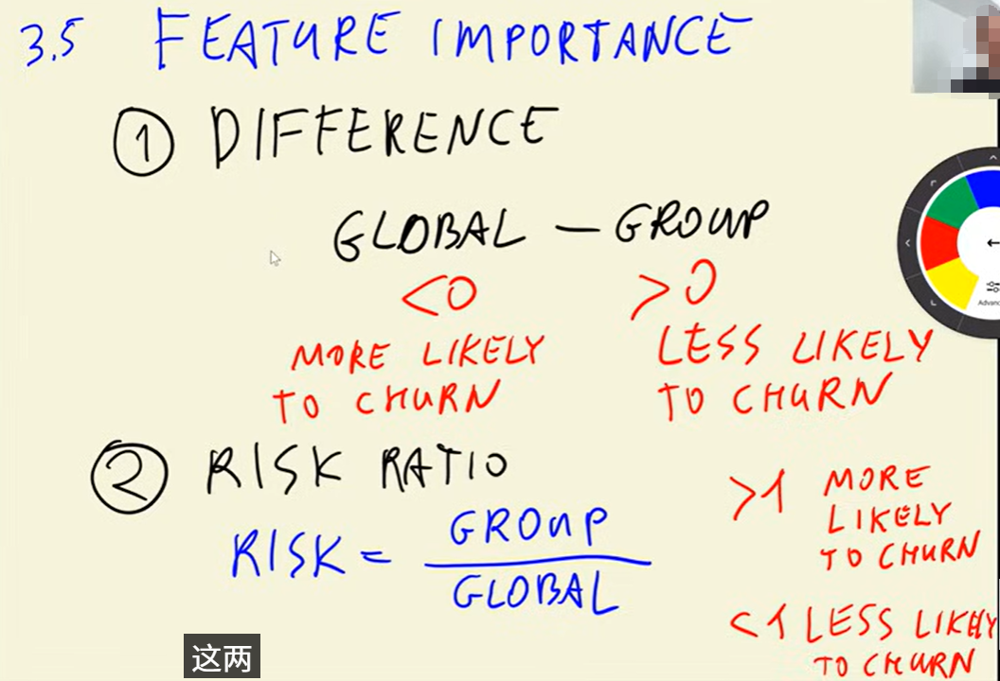

SELECT
gender,
AVG(churn),
AVG(churn) - churn_global AS diff,
AVG(churn) / churn_global AS risk
FROM
data
GROUP BY
gender;

In [57]:
# 将上面的sql，写成pandas的形式。
df_group = df_full_train.groupby('gender').churn.agg(['mean','count'])
df_group['diff'] =  churn_global - df_group['mean'] 
df_group['risk'] = df_group['mean'] / churn_global
df_group

,mean,count,diff,risk
gender,,,,
female,0.276824,2796,-0.006856,1.025396
male,0.263214,2838,0.006755,0.974980


In [58]:
# 找出‘分类变量’中的所有特征值的流失率，与整体流失率的‘不同’和‘风险率’
from IPython.display import display  # 用于在交互环境中渲染输出图片、表格、音频、视频、HTML、DataFrame 等丰富内容

In [59]:
for c in categorical:
    print(c)
    df_group = df_full_train.groupby(c).churn.agg(['mean','count'])
    df_group['diff'] = churn_global - df_group['mean']
    df_group['risk'] = df_group['mean'] / churn_global
    display(df_group)
    print()
    print()

gender


,mean,count,diff,risk
gender,,,,
female,0.276824,2796,-0.006856,1.025396
male,0.263214,2838,0.006755,0.974980




seniorcitizen


,mean,count,diff,risk
seniorcitizen,,,,
0,0.242270,4722,0.027698,0.897403
1,0.413377,912,-0.143409,1.531208




partner


,mean,count,diff,risk
partner,,,,
no,0.329809,2932,-0.059841,1.221659
yes,0.205033,2702,0.064935,0.759472




dependents


,mean,count,diff,risk
dependents,,,,
no,0.313760,3968,-0.043792,1.162212
yes,0.165666,1666,0.104302,0.613651




phoneservice


,mean,count,diff,risk
phoneservice,,,,
no,0.241316,547,0.028652,0.893870
yes,0.273049,5087,-0.003081,1.011412




multiplelines


,mean,count,diff,risk
multiplelines,,,,
no,0.257407,2700,0.012561,0.953474
no_phone_service,0.241316,547,0.028652,0.893870
yes,0.290742,2387,-0.020773,1.076948




internetservice


,mean,count,diff,risk
internetservice,,,,
dsl,0.192347,1934,0.077621,0.712482
fiber_optic,0.425171,2479,-0.155203,1.574895
no,0.077805,1221,0.192163,0.288201




onlinesecurity


,mean,count,diff,risk
onlinesecurity,,,,
no,0.420921,2801,-0.150953,1.559152
no_internet_service,0.077805,1221,0.192163,0.288201
yes,0.153226,1612,0.116742,0.567570




onlinebackup


,mean,count,diff,risk
onlinebackup,,,,
no,0.404323,2498,-0.134355,1.497672
no_internet_service,0.077805,1221,0.192163,0.288201
yes,0.217232,1915,0.052736,0.804660




deviceprotection


,mean,count,diff,risk
deviceprotection,,,,
no,0.395875,2473,-0.125907,1.466379
no_internet_service,0.077805,1221,0.192163,0.288201
yes,0.230412,1940,0.039556,0.853480




techsupport


,mean,count,diff,risk
techsupport,,,,
no,0.418914,2781,-0.148946,1.551717
no_internet_service,0.077805,1221,0.192163,0.288201
yes,0.159926,1632,0.110042,0.592390




streamingtv


,mean,count,diff,risk
streamingtv,,,,
no,0.342832,2246,-0.072864,1.269897
no_internet_service,0.077805,1221,0.192163,0.288201
yes,0.302723,2167,-0.032755,1.121328




streamingmovies


,mean,count,diff,risk
streamingmovies,,,,
no,0.338906,2213,-0.068938,1.255358
no_internet_service,0.077805,1221,0.192163,0.288201
yes,0.307273,2200,-0.037305,1.138182




contract


,mean,count,diff,risk
contract,,,,
month-to-month,0.431701,3104,-0.161733,1.599082
one_year,0.120573,1186,0.149395,0.446621
two_year,0.028274,1344,0.241694,0.104730




paperlessbilling


,mean,count,diff,risk
paperlessbilling,,,,
no,0.172071,2313,0.097897,0.637375
yes,0.338151,3321,-0.068183,1.252560




paymentmethod


,mean,count,diff,risk
paymentmethod,,,,
bank_transfer_(automatic),0.168171,1219,0.101797,0.622928
credit_card_(automatic),0.164339,1217,0.105630,0.608733
electronic_check,0.455890,1893,-0.185922,1.688682
mailed_check,0.193870,1305,0.076098,0.718121


# 3.6  特征重要性：互助信息    Feature importance: Mutual information
互助信息——来自信息论的概念，它告诉我们如果已知一个变量的取值，我们能对另一个变量了解多少。
Mutual information - concept from information theory, it tells us how much we can learn about one variable if we know the value of another
Mutual information 它是一种***衡量分类变量重要性的指标***。

### 上面3.5最后的for循环代码中，我们找出了‘分类变量’中的所有特征值的流失率，与整体流失率的‘不同’和‘风险率’
但我们没办法确认，这些分类变量中，哪些更重要，或者哪个变量比其他变量更不重要。
Mutual information 是信息论中的1个概念，它可以告诉我们，每个变量的重要性。
Mutual information 值越高，我们通过观察另1个变量的值，就能了解越多关于用户流失的信息。

In [60]:
from sklearn.metrics import mutual_info_score

In [61]:
# 它告诉我们，通过观察合同变量的值，我们能了解到多少关于客户流失的信息
mutual_info_score(df_full_train.contract,df_full_train.churn)

0.0983203874041556

In [62]:
mutual_info_score(df_full_train.gender,df_full_train.churn)

0.0001174846211139946

#### 以上两条内容，我们可以获知，用户签订合同的类型和用户的性别，前者获得信息比后者的信息更重要。
#### 下面我们把所有的分类都求出对应的mutual值

In [63]:
def  mutual_info_churn_score(series):
    return mutual_info_score(series,df_full_train.churn)

In [64]:
mi = df_full_train[categorical].apply(mutual_info_churn_score) 
mi.sort_values(ascending=False)

contract            0.098320
onlinesecurity      0.063085
techsupport         0.061032
internetservice     0.055868
onlinebackup        0.046923
deviceprotection    0.043453
paymentmethod       0.043210
streamingtv         0.031853
streamingmovies     0.031581
paperlessbilling    0.017589
dependents          0.012346
partner             0.009968
seniorcitizen       0.009410
multiplelines       0.000857
phoneservice        0.000229
gender              0.000117
dtype: float64

# 3.7  特征重要性：相互关系，关联，相关量      Feature importance: Correlation
数值列又是如何影响流失率的呢？     How about numerical columns?
相关系数     Correlation coefficient ：一个数值或函数，用于表示两组数据或两个随机变量之间的相关程度，其值等于它们的协方差除以它们标准差的乘积。

### 3.6 是衡量分类特征的重要性的指标，这一节讨论数值类型的变量。
### pearson 相关性系数：是衡量两个变量之间依赖关系的指标。
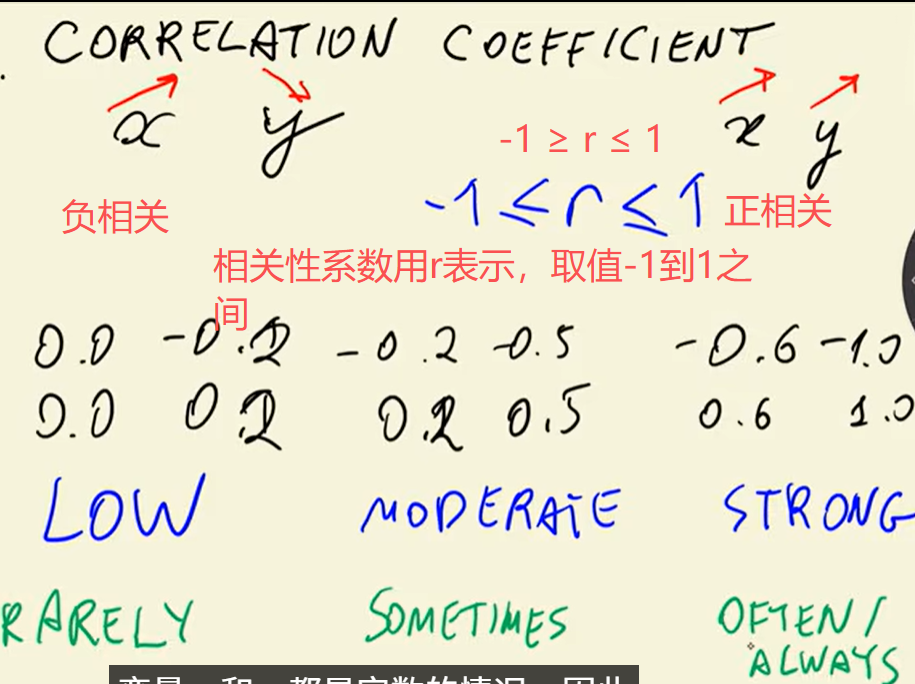

#### 在我们的案例中，数据集的y值，是1个二元变量，0表示用户未流失，1表示用户流失了
#### 假设X是‘tenure’，即用户在我们这里停留的月数；y 是churn。
####  tenure，它是1个变量，假设它的取值范围是：0  到 72  (df_full_train.tenure.min() 和max()去查看）
上述情况下，
- x 和 y 之间如果存在***正相关***，表示：当x增加时，客户留存时间越长，客户流失率就越高。
- x 和 y 之间，如果存在***负相关***，则表示：当x增加时，客户留存时间越长，客户流失率就越低。
- x 和 y 之间，如果存在***零相关***，则表示：x的增加或者减少，对客户的流失率没有影响，不相关。
#### 下面我们就找一找，数据集中，数值变量与y值‘流失率churn’之间的相关性。

In [65]:
df_full_train.dtypes

customerid              str
gender                  str
seniorcitizen         int64
partner                 str
dependents              str
tenure                int64
phoneservice            str
multiplelines           str
internetservice         str
onlinesecurity          str
onlinebackup            str
deviceprotection        str
techsupport             str
streamingtv             str
streamingmovies         str
contract                str
paperlessbilling        str
paymentmethod           str
monthlycharges      float64
totalcharges        float64
churn                 int64
dtype: object

In [66]:
numerical = ['tenure','monthlycharges','totalcharges']

In [67]:
cor = df_full_train[numerical].corrwith(df_full_train.churn) # 求出相关性
cor.sort_values()

tenure           -0.351885
totalcharges     -0.196353
monthlycharges    0.196805
dtype: float64

#### 相关性结果：
- tenure              当用户的留存时长增加时，用户的流失率会持续下降； ***负相关**
- totalcharges        当用户的总费用增长时，用户的流失率会持续下降；***负相关***
- monthlycharges      当用户的月度费用增长时，用户的流失率会持续上升；***正相关***
#### 如果把结果的‘负号’去掉
表示： tenure  对于用户的流失率是最重要的指标，另外两个重要性差不多

In [68]:
# 我们来验证一下相关性的结果,查看用户留存时长，与用户流失率的关系
df_full_train[df_full_train.tenure <=2].churn.mean()

np.float64(0.5953420669577875)

In [69]:
df_full_train[(df_full_train.tenure >2) & (df_full_train.tenure <=12)].churn.mean()

np.float64(0.3994413407821229)

In [70]:
df_full_train[(df_full_train.tenure >12) & (df_full_train.tenure <=72)].churn.mean()

np.float64(0.17634908339788277)

#### 以上3行代码，表示了：随着用户留存时长的增加，，用户的流失率是显著降低的
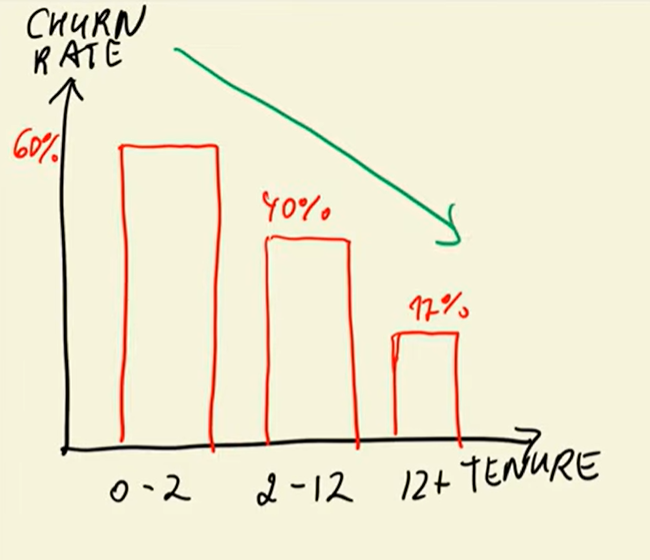

#### 再看一下其他的数值变量的情况

In [71]:
monthlycharges_min = df_full_train.monthlycharges.min()
monthlycharges_min

np.float64(18.25)

In [72]:
monthlycharges_max = df_full_train.monthlycharges.max()
monthlycharges_max

np.float64(118.65)

In [73]:
df_full_train[df_full_train.monthlycharges <=20].churn.mean()

np.float64(0.08795411089866156)

In [74]:
df_full_train[(df_full_train.monthlycharges >=20) & (df_full_train.monthlycharges <=50)].churn.mean()

np.float64(0.18074074074074073)

In [75]:
df_full_train[(df_full_train.monthlycharges >=50)].churn.mean()

np.float64(0.3248223216635957)

### 以上对月度费用的数值变量与用户流失率的关系，表明：***月度费用越高***，***用户流失率越高***
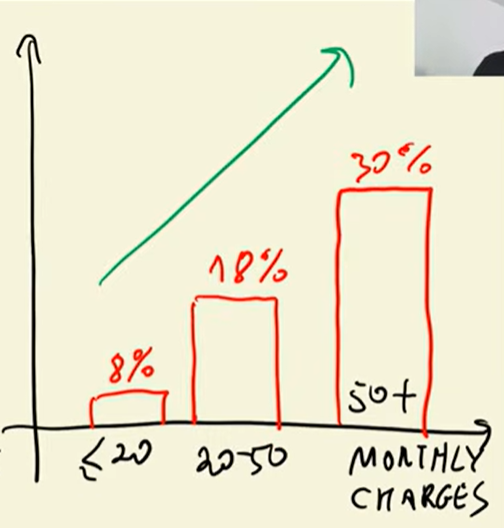

# 3.8  独热编码   One-hot encoding
- 使用 Scikit-Learn 对分类特征进行编码     · Use Scikit-Learn to encode categorical features

#### 这节的内容，主要是讲，如何对***分类特征进行编码***
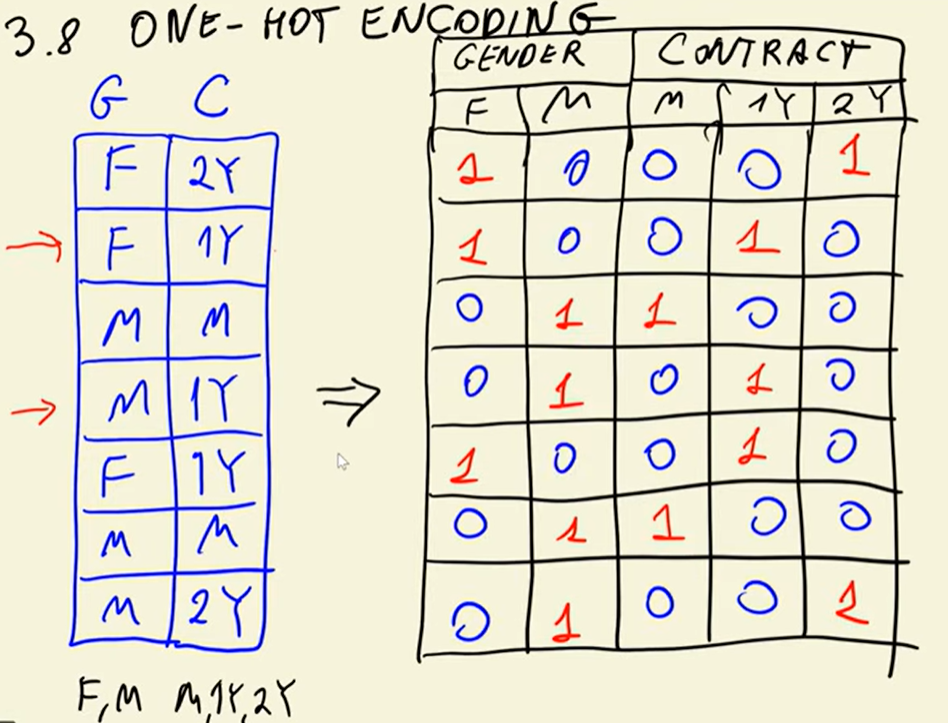

In [76]:
from sklearn.feature_extraction  import DictVectorizer   #导入字典向量 库

In [77]:
df_train[['gender','contract']].iloc[:100]   

,gender,contract
0,female,two_year
1,male,month-to-month
2,female,month-to-month
3,female,month-to-month
4,female,two_year
...,...,...
95,male,one_year
96,female,month-to-month
97,male,month-to-month
98,male,one_year


In [78]:
# 把上面的结果转换成字典类型，发现是嵌套字典类型，
# 它的优点是按列访问高效（比如要获取所有性别，一次就能拿到），但缺点是按行访问不够直观。
df_train[['gender','contract']].iloc[:100].to_dict()

{'gender': {0: 'female',
  1: 'male',
  2: 'female',
  3: 'female',
  4: 'female',
  5: 'male',
  6: 'male',
  7: 'female',
  8: 'female',
  9: 'female',
  10: 'female',
  11: 'male',
  12: 'female',
  13: 'female',
  14: 'female',
  15: 'male',
  16: 'female',
  17: 'female',
  18: 'male',
  19: 'male',
  20: 'male',
  21: 'female',
  22: 'female',
  23: 'female',
  24: 'male',
  25: 'male',
  26: 'female',
  27: 'female',
  28: 'female',
  29: 'female',
  30: 'male',
  31: 'male',
  32: 'female',
  33: 'female',
  34: 'male',
  35: 'female',
  36: 'female',
  37: 'male',
  38: 'male',
  39: 'female',
  40: 'female',
  41: 'male',
  42: 'female',
  43: 'male',
  44: 'male',
  45: 'female',
  46: 'male',
  47: 'female',
  48: 'male',
  49: 'female',
  50: 'male',
  51: 'male',
  52: 'female',
  53: 'male',
  54: 'female',
  55: 'female',
  56: 'male',
  57: 'male',
  58: 'female',
  59: 'female',
  60: 'male',
  61: 'female',
  62: 'male',
  63: 'female',
  64: 'male',
  65: 'male',
  

In [79]:
# 把上面的结果转换成字典类型，这次是：列表嵌套字典（list of dicts），它是按照行组织的
dicts = df_train[['gender','contract']].iloc[:100].to_dict(orient='records')
dicts 

[{'gender': 'female', 'contract': 'two_year'},
 {'gender': 'male', 'contract': 'month-to-month'},
 {'gender': 'female', 'contract': 'month-to-month'},
 {'gender': 'female', 'contract': 'month-to-month'},
 {'gender': 'female', 'contract': 'two_year'},
 {'gender': 'male', 'contract': 'month-to-month'},
 {'gender': 'male', 'contract': 'month-to-month'},
 {'gender': 'female', 'contract': 'month-to-month'},
 {'gender': 'female', 'contract': 'two_year'},
 {'gender': 'female', 'contract': 'month-to-month'},
 {'gender': 'female', 'contract': 'two_year'},
 {'gender': 'male', 'contract': 'month-to-month'},
 {'gender': 'female', 'contract': 'two_year'},
 {'gender': 'female', 'contract': 'month-to-month'},
 {'gender': 'female', 'contract': 'month-to-month'},
 {'gender': 'male', 'contract': 'month-to-month'},
 {'gender': 'female', 'contract': 'two_year'},
 {'gender': 'female', 'contract': 'month-to-month'},
 {'gender': 'male', 'contract': 'one_year'},
 {'gender': 'male', 'contract': 'two_year'},
 {

In [80]:
dv = DictVectorizer(sparse=False)   # 初始化字典向量化器,不适用稀疏矩阵，如果这个参数不加，默认结果是稀疏矩阵类型的。
 #它可以把字典里的类别型字符串（比如 'female', 'male', 'two_year'），自动转换成机器能计算的数值向量（也就是数字）。
#这背后的技术叫做 One-Hot 编码（独热编码）。
dv.fit(dicts)

,"dtype dtype: dtype, default=np.float64The type of feature values. Passed to Numpy array/scipy.sparse matrixconstructors as the dtype argument.",<class 'numpy.float64'>
,"separator separator: str, default=""=""Separator string used when constructing new features for one-hotcoding.",'='
,"sparse sparse: bool, default=TrueWhether transform should produce scipy.sparse matrices.",False
,"sort sort: bool, default=TrueWhether ``feature_names_`` and ``vocabulary_`` should besorted when fitting.",True


In [81]:
dv.get_feature_names_out()  #这个输出，顺序对应到下面的每一列的字段

array(['contract=month-to-month', 'contract=one_year',
       'contract=two_year', 'gender=female', 'gender=male'], dtype=object)

In [82]:
dv.transform(dicts)   #返回1个普通的numpy数组，
# **注意**，我们这里演示的逻辑，使用的是分类变量，如果是‘数值变量’，则不会使用独热方式，而是保持原有数值，这里不再演示。

array([[0., 0., 1., 1., 0.],
       [1., 0., 0., 0., 1.],
       [1., 0., 0., 1., 0.],
       [1., 0., 0., 1., 0.],
       [0., 0., 1., 1., 0.],
       [1., 0., 0., 0., 1.],
       [1., 0., 0., 0., 1.],
       [1., 0., 0., 1., 0.],
       [0., 0., 1., 1., 0.],
       [1., 0., 0., 1., 0.],
       [0., 0., 1., 1., 0.],
       [1., 0., 0., 0., 1.],
       [0., 0., 1., 1., 0.],
       [1., 0., 0., 1., 0.],
       [1., 0., 0., 1., 0.],
       [1., 0., 0., 0., 1.],
       [0., 0., 1., 1., 0.],
       [1., 0., 0., 1., 0.],
       [0., 1., 0., 0., 1.],
       [0., 0., 1., 0., 1.],
       [1., 0., 0., 0., 1.],
       [0., 1., 0., 1., 0.],
       [1., 0., 0., 1., 0.],
       [0., 0., 1., 1., 0.],
       [1., 0., 0., 0., 1.],
       [0., 0., 1., 0., 1.],
       [1., 0., 0., 1., 0.],
       [1., 0., 0., 1., 0.],
       [1., 0., 0., 1., 0.],
       [0., 1., 0., 1., 0.],
       [1., 0., 0., 0., 1.],
       [1., 0., 0., 0., 1.],
       [0., 1., 0., 1., 0.],
       [0., 1., 0., 1., 0.],
       [1., 0.

In [83]:
# 给训练数据集，取所有分类变量和数值变量中的所有数据行
train_dicts = df_train[categorical + numerical].to_dict(orient='records')

In [84]:
train_dicts[0] 

{'gender': 'female',
 'seniorcitizen': 0,
 'partner': 'yes',
 'dependents': 'yes',
 'phoneservice': 'yes',
 'multiplelines': 'yes',
 'internetservice': 'fiber_optic',
 'onlinesecurity': 'yes',
 'onlinebackup': 'yes',
 'deviceprotection': 'yes',
 'techsupport': 'yes',
 'streamingtv': 'yes',
 'streamingmovies': 'yes',
 'contract': 'two_year',
 'paperlessbilling': 'yes',
 'paymentmethod': 'electronic_check',
 'tenure': 72,
 'monthlycharges': 115.5,
 'totalcharges': 8425.15}

In [85]:
dv.fit(train_dicts)


,"dtype dtype: dtype, default=np.float64The type of feature values. Passed to Numpy array/scipy.sparse matrixconstructors as the dtype argument.",<class 'numpy.float64'>
,"separator separator: str, default=""=""Separator string used when constructing new features for one-hotcoding.",'='
,"sparse sparse: bool, default=TrueWhether transform should produce scipy.sparse matrices.",False
,"sort sort: bool, default=TrueWhether ``feature_names_`` and ``vocabulary_`` should besorted when fitting.",True


In [86]:
feature_names_out = dv.get_feature_names_out()  # 输出内容，可以留意到：数值类型，没有分类，只有1个字段
feature_names_out

array(['contract=month-to-month', 'contract=one_year',
       'contract=two_year', 'dependents=no', 'dependents=yes',
       'deviceprotection=no', 'deviceprotection=no_internet_service',
       'deviceprotection=yes', 'gender=female', 'gender=male',
       'internetservice=dsl', 'internetservice=fiber_optic',
       'internetservice=no', 'monthlycharges', 'multiplelines=no',
       'multiplelines=no_phone_service', 'multiplelines=yes',
       'onlinebackup=no', 'onlinebackup=no_internet_service',
       'onlinebackup=yes', 'onlinesecurity=no',
       'onlinesecurity=no_internet_service', 'onlinesecurity=yes',
       'paperlessbilling=no', 'paperlessbilling=yes', 'partner=no',
       'partner=yes', 'paymentmethod=bank_transfer_(automatic)',
       'paymentmethod=credit_card_(automatic)',
       'paymentmethod=electronic_check', 'paymentmethod=mailed_check',
       'phoneservice=no', 'phoneservice=yes', 'seniorcitizen',
       'streamingmovies=no', 'streamingmovies=no_internet_service',

In [87]:
len(feature_names_out)

45

In [88]:
X_train = dv.transform(train_dicts)

In [89]:
X_train.shape

(4225, 45)

In [90]:
# 合并一下数据处理的步骤,这个‘dv.fit_transform ’1个函数，就搞定了数据准备的核心工作，不需要分步操作
X_train1 = dv.fit_transform(train_dicts)

In [91]:
X_train1.shape

(4225, 45)

In [92]:
# 对验证数据集和测试数据集 做数据准备工作
val_dicts = df_val[categorical + numerical].to_dict(orient='records')

In [93]:
# 注意，这里只做transform，不做fit，只有训练数据做fit就可以了。
X_val = dv.transform(val_dicts)

In [94]:
X_val.shape

(1409, 45)

# 3.9  逻辑回归    Logistic regression  
- 二进制分类                   Binary classification
- 线性回归 vs 逻辑回归         Linear vs logistic regression

#### 线性回归回答"是多少"，逻辑回归回答"是不是"。
#### 线性回归：预测房价
预测结果：8425.15 元/平米  ✅ 任意实数

#### 逻辑回归：预测是否流失
预测结果：0.87  →  表示有87%概率会流失  ✅ 0~1之间

逻辑回归本质：在线性回归基础上套了一个 Sigmoid 函数，把输出压缩到 (0,1) 区间

名字误会：虽然叫"回归"，但逻辑回归是分类算法（二分类常用）
#### 应用场景：
- **线性回归**：房价、温度、销量预测
- **逻辑回归**：垃圾邮件识别、客户流失预测、疾病诊断

In [95]:
def  sigmoid(z):
    return 1 / (1 + np.exp(-z))

In [96]:
z = np.linspace(-5,5,51)  #在 -5 到 5 之间，等距离生成 51 个数字。

In [97]:
sigmoid(z)

array([0.00669285, 0.00816257, 0.0099518 , 0.01212843, 0.01477403,
       0.01798621, 0.02188127, 0.02659699, 0.03229546, 0.03916572,
       0.04742587, 0.05732418, 0.06913842, 0.0831727 , 0.09975049,
       0.11920292, 0.14185106, 0.16798161, 0.19781611, 0.23147522,
       0.26894142, 0.31002552, 0.35434369, 0.40131234, 0.450166  ,
       0.5       , 0.549834  , 0.59868766, 0.64565631, 0.68997448,
       0.73105858, 0.76852478, 0.80218389, 0.83201839, 0.85814894,
       0.88079708, 0.90024951, 0.9168273 , 0.93086158, 0.94267582,
       0.95257413, 0.96083428, 0.96770454, 0.97340301, 0.97811873,
       0.98201379, 0.98522597, 0.98787157, 0.9900482 , 0.99183743,
       0.99330715])

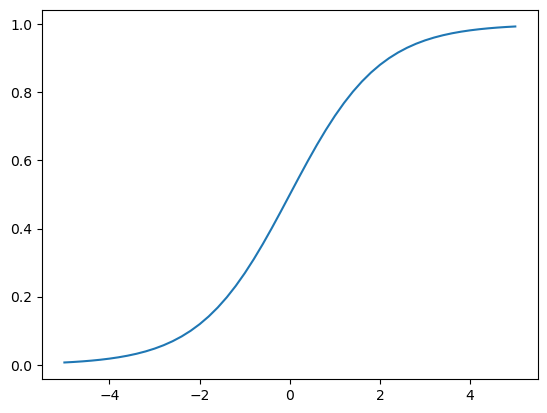

In [98]:
plt.plot(z,sigmoid(z))  

In [99]:
def logistic_regression(xi):
    score = w0
    
    for j in range(len(w)):
        score = score + xi[j] * w[j]
    result = sigmoid(score)
    return result


### 逻辑回归，实际上就是把线性回归的结果转换为概率值

核心定义：回归，就是寻找一种“关系”。

字面意思：Regress 有“回归到某个平均值”或“追溯、倒推”的意思。在数学里，它指探求一个因变量（Y）和一个或多个自变量（X）之间的依赖关系。

举个例子：我们说“研究气温和冰淇淋销量之间的回归关系”，意思就是建立一个公式，让你知道气温每升高 1 度，冰淇淋大概会多卖多少根。

那为什么逻辑回归叫“回归”？
因为它也是在做同样的事情：寻找特征（X）和类别概率（Y）之间的依赖关系。

它最终得到的那个公式，本质上还是一个线性方程：
z=w1x1+w2x2+b
z=w1x1+w2x2+b。

只不过它最后用 Sigmoid 函数把结果 z 变成了概率。

一个帮助记忆的类比：

线性回归：直接告诉你答案。比如问你“下午 3 点有多热？”，它直接告诉你“35 度”。

逻辑回归：不直接告诉你答案，而是问你“下午 3 点有多大概率会超过 30 度？”，它告诉你“80%”。

所以，回归，就是寻找一个数学公式来量化事物之间的因果关系。线性回归找的是具体的数值关系，而逻辑回归找的是导致某个结果发生的概率关系。

# 3.10  使用 Scikit-Learn 训练逻辑回归模型      Training logistic regression with Scikit-Learn
- 使用 Scikit-Learn 训练模型     Train a model with Scikit-Learn
- 将模型应用于验证集              Apply it to the validation dataset
- 计算准确率                     Calculate the accuracy

In [100]:
from sklearn.linear_model import LogisticRegression

In [101]:
model = LogisticRegression()
model.fit(X_train,y_train)     # 在训练集上训练

/root/miniconda3/envs/quant/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 100 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=100).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


,"penalty penalty: {'l1', 'l2', 'elasticnet', None}, default='l2'Specify the norm of the penalty:- `None`: no penalty is added;- `'l2'`: add a L2 penalty term and it is the default choice;- `'l1'`: add a L1 penalty term;- `'elasticnet'`: both L1 and L2 penalty terms are added... warning:: Some penalties may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionadded:: 0.19 l1 penalty with SAGA solver (allowing 'multinomial' + L1).. deprecated:: 1.8 `penalty` was deprecated in version 1.8 and will be removed in 1.10. Use `l1_ratio` instead. `l1_ratio=0` for `penalty='l2'`, `l1_ratio=1` for `penalty='l1'` and `l1_ratio` set to any float between 0 and 1 for `'penalty='elasticnet'`.",'deprecated'
,"C C: float, default=1.0Inverse of regularization strength; must be a positive float.Like in support vector machines, smaller values specify strongerregularization. `C=np.inf` results in unpenalized logistic regression.For a visual example on the effect of tuning the `C` parameterwith an L1 penalty, see::ref:`sphx_glr_auto_examples_linear_model_plot_logistic_path.py`.",1.0
,"l1_ratio l1_ratio: float, default=0.0The Elastic-Net mixing parameter, with `0 <= l1_ratio <= 1`. Setting`l1_ratio=1` gives a pure L1-penalty, setting `l1_ratio=0` a pure L2-penalty.Any value between 0 and 1 gives an Elastic-Net penalty of the form`l1_ratio * L1 + (1 - l1_ratio) * L2`... warning:: Certain values of `l1_ratio`, i.e. some penalties, may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionchanged:: 1.8 Default value changed from None to 0.0... deprecated:: 1.8 `None` is deprecated and will be removed in version 1.10. Always use `l1_ratio` to specify the penalty type.",0.0
,"dual dual: bool, default=FalseDual (constrained) or primal (regularized, see also:ref:`this equation `) formulation. Dual formulationis only implemented for l2 penalty with liblinear solver. Prefer `dual=False`when n_samples > n_features.",False
,"tol tol: float, default=1e-4Tolerance for stopping criteria.",0.0001
,"fit_intercept fit_intercept: bool, default=TrueSpecifies if a constant (a.k.a. bias or intercept) should beadded to the decision function.",True
,"intercept_scaling intercept_scaling: float, default=1Useful only when the solver `liblinear` is usedand `self.fit_intercept` is set to `True`. In this case, `x` becomes`[x, self.intercept_scaling]`,i.e. a ""synthetic"" feature with constant value equal to`intercept_scaling` is appended to the instance vector.The intercept becomes``intercept_scaling * synthetic_feature_weight``... note:: The synthetic feature weight is subject to L1 or L2 regularization as all other features. To lessen the effect of regularization on synthetic feature weight (and therefore on the intercept) `intercept_scaling` has to be increased.",1
,"class_weight class_weight: dict or 'balanced', default=NoneWeights associated with classes in the form ``{class_label: weight}``.If not given, all classes are supposed to have weight one.The ""balanced"" mode uses the values of y to automatically adjustweights inversely proportional to class frequencies in the input dataas ``n_samples / (n_classes * np.bincount(y))``.Note that these weights will be multiplied with sample_weight (passedthrough the fit method) if sample_weight is specified... versionadded:: 0.17 *class_weight='balanced'*",None
,"random_state random_state: int, RandomState instance, default=NoneUsed when ``solver`` == 'sag', 'saga' or 'liblinear' to shuffle thedata. See :term:`Glossary ` for details.",None
,"solver solver: {'lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'}, default='lbfgs'Algorithm to use in the optimization problem. Default is 'lbfgs'.To choose a solver, you might want to consider the following aspects:- 'lbfgs' is a good default solver because it works reasonably well for a wide class of problems.- For :term:`mul

In [102]:
model.coef_[0].round(3) #查看权重值

array([ 0.473, -0.174, -0.406, -0.03 , -0.078,  0.063, -0.089, -0.081,
       -0.034, -0.073, -0.334,  0.315, -0.089,  0.004, -0.258,  0.141,
        0.009,  0.063, -0.089, -0.081,  0.265, -0.089, -0.283, -0.231,
        0.123, -0.166,  0.058, -0.087, -0.032,  0.07 , -0.059,  0.141,
       -0.249,  0.215, -0.12 , -0.089,  0.101, -0.07 , -0.089,  0.052,
        0.213, -0.089, -0.231, -0.071,  0.   ])

In [103]:
model.intercept_[0]    #查看截距值

np.float64(-0.10907857257032483)

In [104]:
model.predict(X_train)  #生成预测值  ，这是硬预测hardpre，这不是我们想要的概率，里面只有0或者1的值

array([0, 1, 1, ..., 1, 0, 1], shape=(4225,))

In [105]:
model.predict_proba(X_train)  # 这个才是代表预测概率的函数,这叫做软预测。看模型在训练集上的表现

array([[0.90374603, 0.09625397],
       [0.32136782, 0.67863218],
       [0.36693178, 0.63306822],
       ...,
       [0.46880891, 0.53119109],
       [0.95762536, 0.04237464],
       [0.30220379, 0.69779621]], shape=(4225, 2))

### 这个软预测，有2列，
- 第1列 ，是**负类**的概率  就是**不流失的概率**
- 第2列，是**正类**的概率    就是**流失的概率**
### 我们关心的是第2列，prob of churning  流失的概率

In [106]:
y_val_pred = model.predict_proba(X_val)[:,1]    #只取全部行，第2列的值，**这里对验证集进行结果预测**
y_val_pred

array([0.00903294, 0.20392974, 0.21156056, ..., 0.13653422, 0.79899904,
       0.83664115], shape=(1409,))

In [107]:
churn_decision = (y_val_pred >=0.5)   # 设置的阈值 0.5
churn_decision   #  false表示用户不会流失，true表示用户会流失

array([False, False, False, ..., False,  True,  True], shape=(1409,))

In [108]:
type(churn_decision)

numpy.ndarray

In [109]:
# 筛选哪些用户会流失，使用布尔索引方式，Pandas 做布尔索引就是这个过程：只看位置，不看内容。
df_val[churn_decision].customerid  # Pandas 布尔索引：用 True/False 的列表（或数组/Series）作为"筛子"，只保留 True 对应的行。

3       8433-wxgna
8       3440-jpscl
11      2637-fkfsy
12      7228-omtpn
19      6711-fldfb
           ...    
1397    5976-jcjrh
1398    2034-cgrhz
1399    5276-kqwhg
1407    6521-yytyi
1408    3049-solay
Name: customerid, Length: 311, dtype: str

### 上面这个结果表示：有311个用户需要发给优惠券，并且给出了每个用户的id

In [110]:
# 现在看看**‘预测结果’得准确性**
# 对于回归，我们使用均方根误差RMSE来衡量‘预测结果’的准确性
y_val

array([0, 0, 0, ..., 0, 1, 1], shape=(1409,))

In [111]:
churn_decision.astype(int)

array([0, 0, 0, ..., 0, 1, 1], shape=(1409,))

In [112]:
(y_val == churn_decision).mean()  #查看一下验证集中的y值numpy数组，与预测结果的匹配程度，是80%，这个概率是可以接受的。

np.float64(0.8034066713981547)

In [113]:
# 用dataframe演示一下上面的计算的过程
df_pred = pd.DataFrame()
df_pred['probability'] = y_val_pred
df_pred['prediction'] = churn_decision.astype(int)
df_pred['actual'] = y_val

In [114]:
df_pred

,probability,prediction,actual
0,0.009033,0,0
1,0.203930,0,0
2,0.211561,0,0
3,0.542742,1,1
4,0.213204,0,0
...,...,...,...
1404,0.312344,0,0
1405,0.039402,0,1
1406,0.136534,0,0
1407,0.798999,1,1


In [115]:
df_pred['correct'] = df_pred.prediction == df_pred.actual

In [116]:
df_pred

,probability,prediction,actual,correct
0,0.009033,0,0,True
1,0.203930,0,0,True
2,0.211561,0,0,True
3,0.542742,1,1,True
4,0.213204,0,0,True
...,...,...,...,...
1404,0.312344,0,0,True
1405,0.039402,0,1,False
1406,0.136534,0,0,True
1407,0.798999,1,1,True


In [117]:
df_pred.correct.mean()  

np.float64(0.8034066713981547)

# 4 Evaluation Metrics for Classification
### In the previous session we trained a model for predicting churn. How do we know if it's good?
### 分类的评估指标¶
### 在上一节中，我们训练了一个用于预测客户流失的模型。我们如何判断这个模型是否良好呢？

# 4.2 Accuracy and dummy model

### 注意：第4节的内容，是在第3节内容的基础上进行，所以我复制了第三节所有的内容的副本，所以你会看到我会在这里插入第4节的内容

In [118]:
len(y_val)

1409

In [119]:
(y_val == churn_decision).sum()  # 模型预测结果，与1409个y值结果对比，正确的数量是1132，正确率是80.34%不到

np.int64(1132)

In [120]:
(y_val == churn_decision).mean()

np.float64(0.8034066713981547)

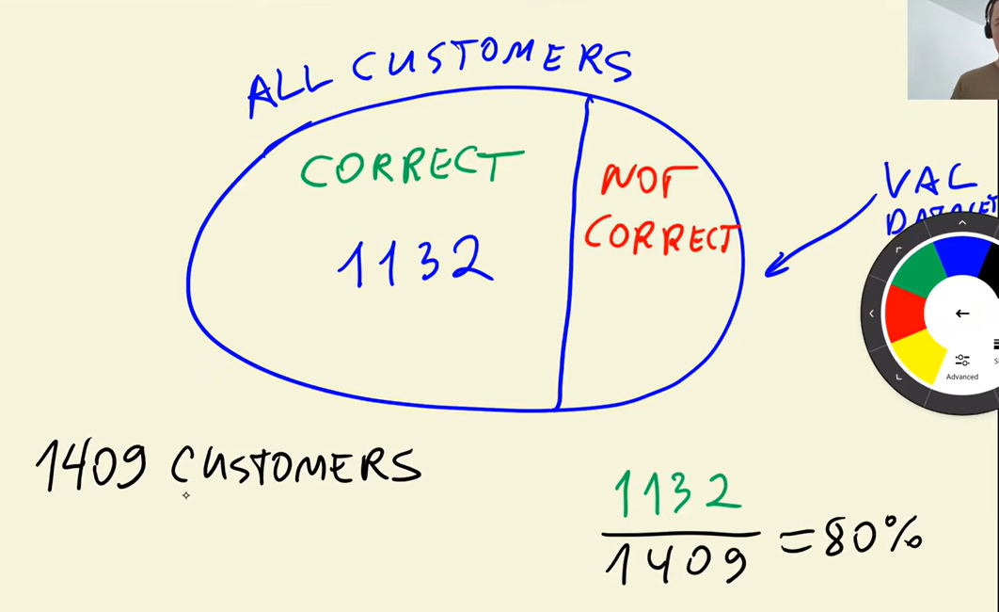

In [121]:
# 回看上面模型对验证数据集做的流失率预测结果的代码中：churn_decision = (y_val_pred >=0.5)
# 这一行，为什么使用0.5这个阈值，去筛选验证数据集中人员流失的结论呢？

In [122]:
from sklearn.metrics import  accuracy_score  #accuracy_score 是 scikit-learn 中用于计算分类准确率的常用指标

In [123]:
accuracy_score(y_val,y_val_pred>=0.5)  #用这个函数，得出来的准确率，也是一样的。

0.8034066713981547

In [124]:
# 我们来看看，这个阈值0.5 ，是如何得出来的
thresholds = np.linspace(0, 1, 21)  
thresholds

array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 ,
       0.55, 0.6 , 0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95, 1.  ])

In [125]:
scores = []
for t in thresholds:   # thresholds /ˈθreʃˌhoʊldz/阈值
    churn_decision = (y_val_pred >= t)
    score = (y_val == churn_decision).mean()
    #print('%.2f  %.3f' % (t,score))
    print('{:.2f}  {:.3f}'.format(t, score))
    scores.append(score)
scores

0.00  0.274
0.05  0.509
0.10  0.591
0.15  0.666
0.20  0.710
0.25  0.737
0.30  0.760
0.35  0.772
0.40  0.785
0.45  0.793
0.50  0.803
0.55  0.801
0.60  0.795
0.65  0.786
0.70  0.766
0.75  0.744
0.80  0.735
0.85  0.726
0.90  0.726
0.95  0.726
1.00  0.726


[np.float64(0.2739531582682754),
 np.float64(0.5088715400993612),
 np.float64(0.5911994322214337),
 np.float64(0.6664300922640171),
 np.float64(0.7097232079489),
 np.float64(0.7374024130589071),
 np.float64(0.7601135557132718),
 np.float64(0.7721788502484032),
 np.float64(0.7849538679914834),
 np.float64(0.7934705464868701),
 np.float64(0.8034066713981547),
 np.float64(0.801277501774308),
 np.float64(0.794889992902768),
 np.float64(0.7863733144073811),
 np.float64(0.765791341376863),
 np.float64(0.7444996451383961),
 np.float64(0.7345635202271115),
 np.float64(0.7260468417317246),
 np.float64(0.7260468417317246),
 np.float64(0.7260468417317246),
 np.float64(0.7260468417317246)]

### 从上面的输出，可以看出来：阈值为0.5的时候，流失率的预测准确性是最高的

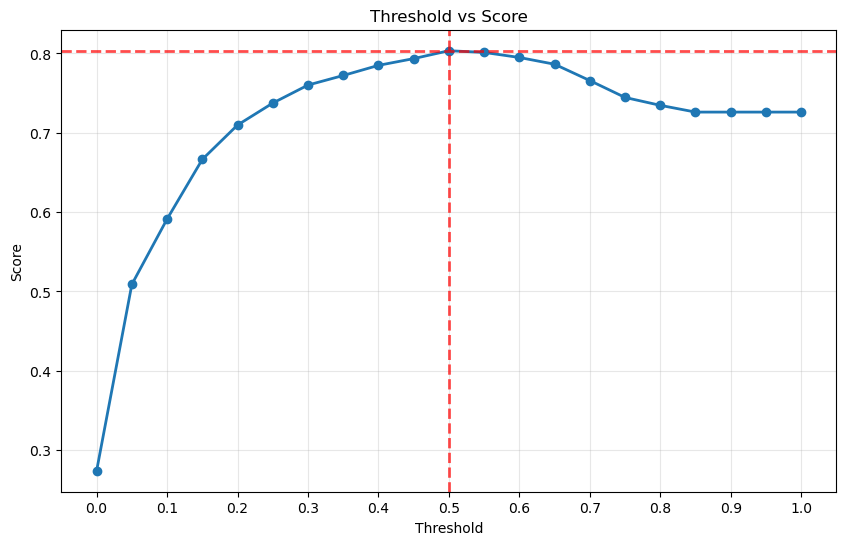

In [126]:
plt.figure(figsize=(10, 6))
plt.plot(thresholds, scores, marker='o', linestyle='-', linewidth=2, markersize=6)
plt.xticks(np.arange(0, 1.1, 0.1))
plt.axvline(x=0.5, color='red', linestyle='--', linewidth=2, alpha=0.7)
plt.axhline(y=0.8034066713981547, color='red', linestyle='--', linewidth=2, alpha=0.7) 
plt.grid(True, alpha=0.3)
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.title('Threshold vs Score')
plt.show()

In [127]:
from  collections import Counter  # 统计模块，查看对象中，0和1的数量

In [128]:
Counter(y_val_pred >= 1.0)   #计算模型预测值中大于等于1.0得值得数量

Counter({np.False_: 1409})

In [129]:
Counter(y_val_pred >= 0.5)  #计算模型预测值中大于等于0.5得值得数量

Counter({np.False_: 1098, np.True_: 311})

In [130]:
Counter(y_val)   # 查看验证数据集，y值得数据分布情况

Counter({np.int64(0): 1023, np.int64(1): 386})

In [131]:
1 - y_val.mean()   # 72%得用户，是没有流失的。

np.float64(0.7260468417317246)

In [132]:
1- y_test.mean()

np.float64(0.7530163236337828)

In [133]:
1- y_train.mean()

np.float64(0.7313609467455622)

In [134]:
1- df.churn.mean()

np.float64(0.7346301292063041)

### 通过上面的内容，我们可以看到一个现象
#### 类别不平衡状态：
#### **指二分类中,正负样本数量严重不对等**,这对逻辑回归有3个核心影响：
1. 模型会"偷懒"——偏向预测多数类
2. 概率估计出现偏移
3. 评估指标被扭曲

数据确实存在严重的**类别不平衡问题**，而且这个问题在训练集、验证集、测试集、全量数据集中，都高度一致。
当阈值设为 0.5 时：

预测为不流失（0）：1098 个

预测为流失（1）：311 个

***模型倾向于预测为 0，因为负例占多数，模型"偷懒"了。***
#### 类别不平衡、阈值调优、Dummy Model 这些概念，在 MLOps 中不是"学术理论"，而是直接影响线上模型表现的"生死线"。
## 处理类别不平衡问题，是mlops的核心工作之一


# 4.3 Confusion table  混淆表格

####   Arranging them in a table  将它们整理成表格  
####  Different types of errors and correct decisions   不同类型的错误与正确决策

我们需要一种，不受**类别不平衡**影响的模型质量评估方法。

### alexey画的这幅图，简单直观，
- 预测用户**不会流失**，是**负例**，数值表示是：0，现实可能存在两种结果：1.用户真的没有流失-**真负例**  2.用户流失了-**假负例**
- 预测用户**会流失**，是**正例**，数值表示是：1，现实可能存在两种结果：1.真的流失了-**真正例**  2.没有流失-**假正例**
- 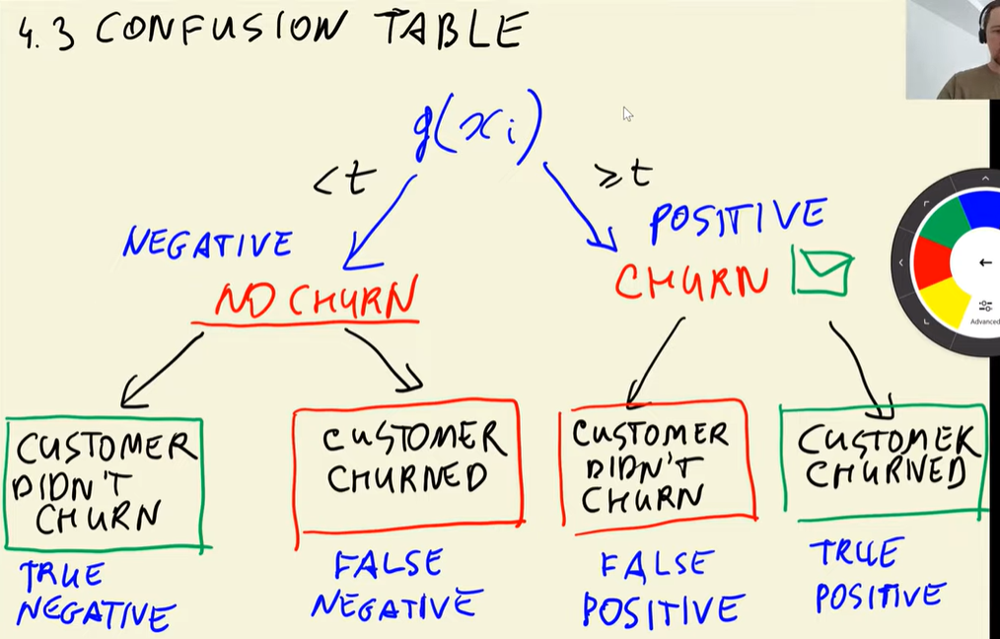

### 通过预测值得正例负例与真实y值得对比，产生四种情况得结果
下面是alexey老师得课堂笔记截图：
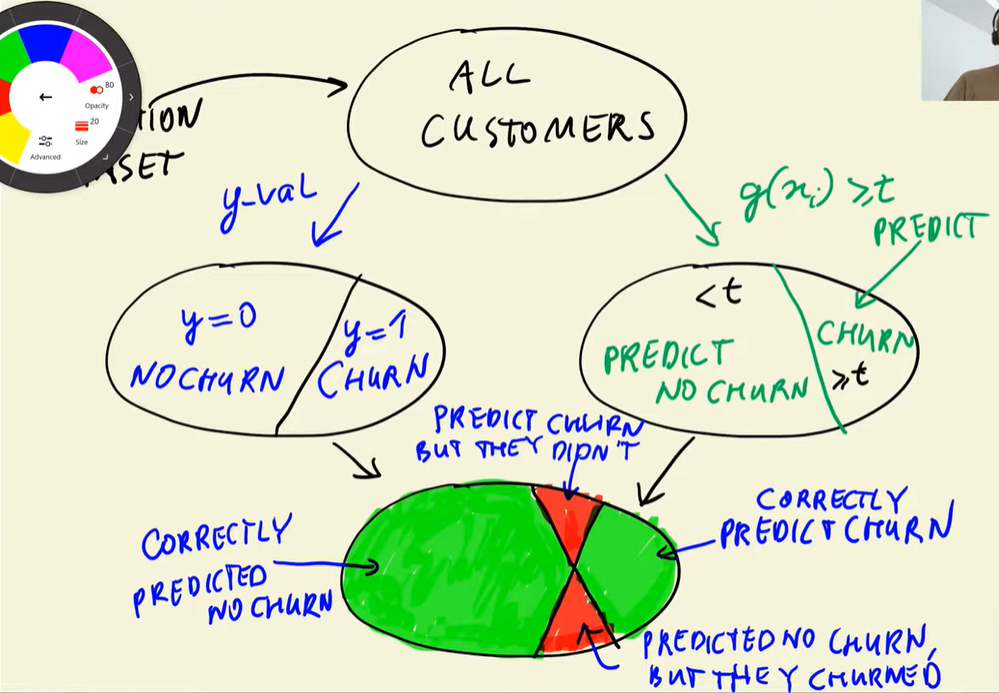

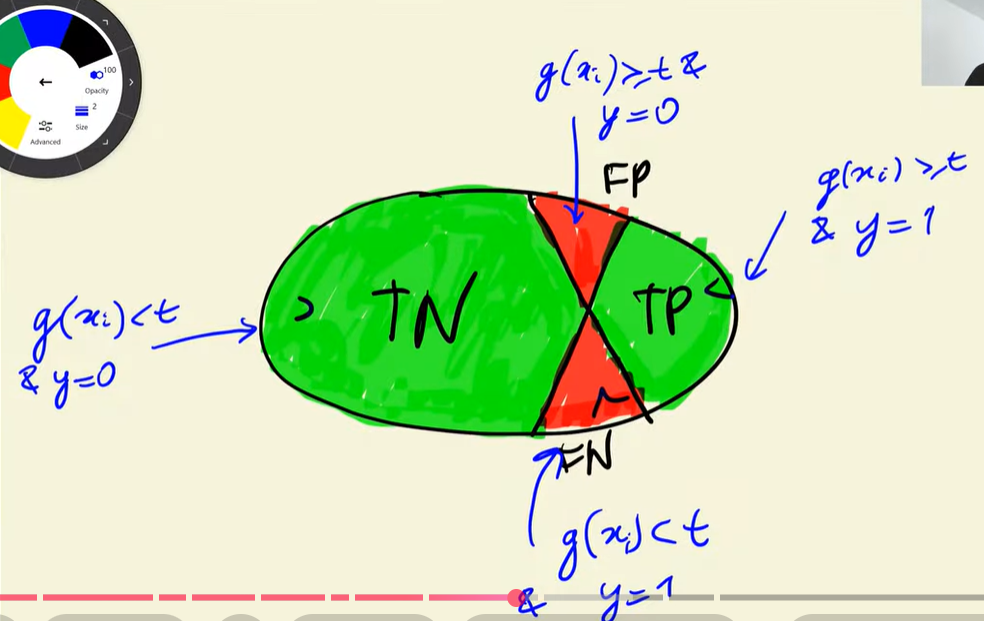
- TP	   True Positive	**真正例**（或“真阳性”）
- FP	   False Positive	**假正例**（或“假阳性”，统计学中称“第一类错误”）
- TN	   True Negative	**真负例**（或“真阴性”）
- FN	   False Negative	**假负例**（或“假阴性”，统计学中称“第二类错误”）

In [135]:
# 用代码实现上述场景
actual_positive = (y_val == 1)  #实际的正例
actual_negative = (y_val == 0)  #实际的负例

In [136]:
t = 0.5
predict_positive = (y_val_pred >= t) #预测的正例
predict_negative = (y_val_pred < t)  #预测的负例

In [137]:
predict_positive[:5]

array([False, False, False,  True, False])

In [138]:
actual_positive[:5]

array([False, False, False,  True, False])

In [139]:
tp = (predict_positive & actual_positive).sum()  # 求TP，两个numpy数组的按位与运算，结果是1的会被统计
tp  

np.int64(210)

In [140]:
fp = (predict_positive & ~actual_positive).sum()  #求FP，~ 是按位取反，会把 0 变 1，1 变 0。
fp

np.int64(101)

In [141]:
tn = (~predict_positive & ~actual_positive).sum()  #求TN
tn

np.int64(922)

In [142]:
fn = (~predict_positive & actual_positive).sum()  #求FN
fn

np.int64(176)

In [143]:
type(X_val)

numpy.ndarray

### 引出**混淆矩阵**的概念
- 先看zlexey老师的笔记：完美把上面的四个结果，对应到矩阵中去了
- 922 + 101 + 176 + 210 =1409  这个值，与 模型的输入X_val 的行数一致。
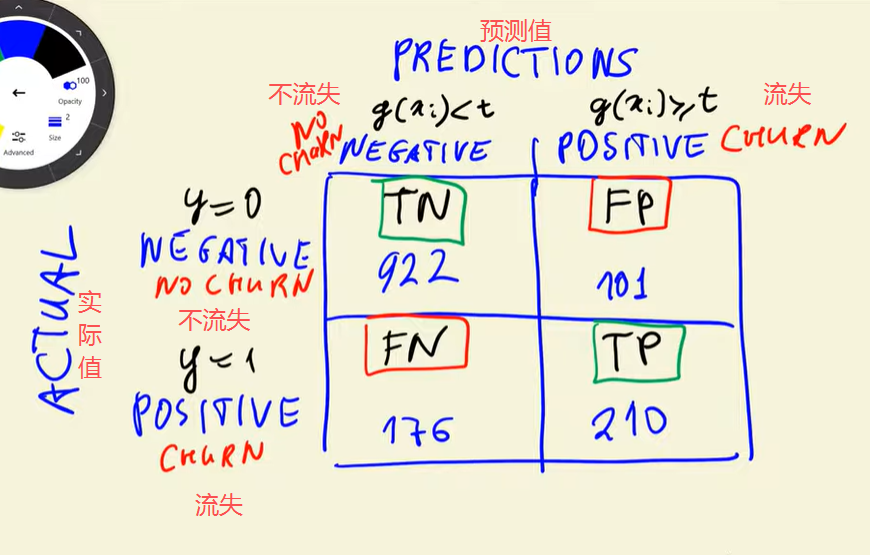

###  FP 假正例  101个用户，会错误的给这101个用户发送优惠卷，造成损失；这101个用户，是不会流失的。--误报
###  FN 假负例 176个用户，这些流失的用户，本应该得到优惠券，但是没有给他们发优惠券，再次造成了损失。--漏报
### FN 漏报  比  FP 误报  多得多


In [144]:
cofustion_matrix = np.array([[tn,fp],[fn,tp]]) # 将四个结果，做成矩阵形式，这就是混淆矩阵
cofustion_matrix

array([[922, 101],
       [176, 210]])

In [145]:
(cofustion_matrix / cofustion_matrix.sum()).round(2)  # 将混淆矩阵归一化,把每个元素转换成百分比（比例）形式

array([[0.65, 0.07],
       [0.12, 0.15]])

### 这一节最后，看看alexey老师，给出的笔记，非常完整的表明了：
- 之前得出的，模型预测结果的80%的准确率，这里可以再次得到验证；
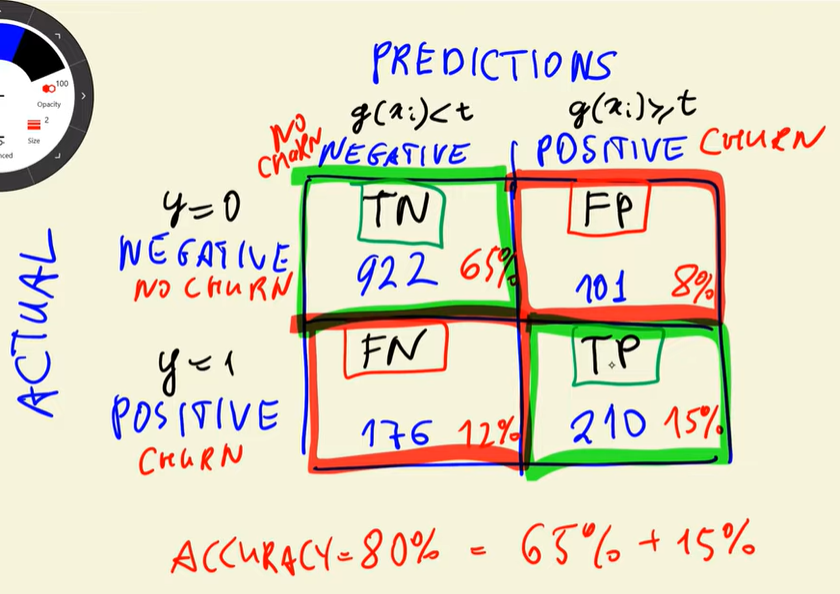

In [146]:
(tp + tn) /(tp + tn + fp +fn)  # 这样计算，也代表的是 准确率（Accuracy）

np.float64(0.8034066713981547)

# 4.4 Precison and Recall   精确率与召回率
精确率和召回率，是评估二元分类模型得重要指标

In [147]:
# 精确率   预测为正例的准不准，"猜对了几个" 的程度
p = tp / (tp + fp)
p

np.float64(0.6752411575562701)

#### 精确率（Precision）	≈ 67.5%	模型预测为"正例"的样本中，真正是正例的占比约三分之二

In [148]:
# 召回率   所有真实的正例中，模型成功找出多少？"漏网之鱼"的比例 — 正例被漏掉了多少？
r = tp / (tp + fn)
r 

np.float64(0.5440414507772021)

#### 召回率（Recall）	≈ 54.4%	所有真实正例中，模型只找出了约一半，漏掉了约 45.6%

### 通过精确率和召回率得计算，我们认为，模型得能力有待提高，单纯的看准确率，评估维度太单一
1. 模型偏向"保守"（漏报严重）
- 召回率仅 54.4%，意味着接近一半的真实正例被模型漏掉了（FN 很高）。
- 如果这是一个医疗诊断或欺诈检测系统，这个漏报率是不可接受的（会漏掉大量真正的病人或欺诈交易）。
2. 预测为正例的"可信度"尚可，但不够高
- 精确率 67.5% 意味着：模型每预测 100 个正例，大约有 67 - 68 个是对的，剩下 32 -33 个是误报（FP）。
- 这个精确率不算很差，但在关键场景中仍需提升。
3. 精确率 > 召回率，说明模型有"歧视"倾向
- 精确率（67.5%）高于召回率（54.4%），说明模型倾向于只预测"最有把握"的样本为正例，对不确定的样本直接判为负例。
- 这会导致：预测少而精（精确率还行），但牺牲了大量真实正例（召回率低）。

# 4.5 ROC Curves    ROC曲线
 Receiver Operating Characteristic Curve（受试者工作特征曲线）
 **ROC 曲线是评估二分类模型性能的常用工具**，它通过展示"在不同阈值下，模型能多好地区分正负例"，来判断模型的整体能力。

### TPR and  FPR   
核心关注这两个指标

In [149]:
tpr = tp / (tp + fn)  #漏报率：假正例率/ 假阳性率，就是召回率
tpr

np.float64(0.5440414507772021)

In [150]:
fpr = fp / (fp + tn)   #误报率：真正例率，要尽量少，这里还有近10%的错误率
fpr

np.float64(0.09872922776148582)

In [151]:
thresholds_2 = np.linspace(0,1,101)
thresholds_2

array([0.  , 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 ,
       0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21,
       0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32,
       0.33, 0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43,
       0.44, 0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.51, 0.52, 0.53, 0.54,
       0.55, 0.56, 0.57, 0.58, 0.59, 0.6 , 0.61, 0.62, 0.63, 0.64, 0.65,
       0.66, 0.67, 0.68, 0.69, 0.7 , 0.71, 0.72, 0.73, 0.74, 0.75, 0.76,
       0.77, 0.78, 0.79, 0.8 , 0.81, 0.82, 0.83, 0.84, 0.85, 0.86, 0.87,
       0.88, 0.89, 0.9 , 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98,
       0.99, 1.  ])

In [152]:
scores = []
for t in thresholds_2:
    actual_positive = (y_val == 1)  #实际的正例
    actual_negative = (y_val == 0)  #实际的负例

    predict_positive = (y_val_pred >= t) #预测的正例
    predict_negative = (y_val_pred < t)  #预测的负例

    tp = (predict_positive & actual_positive).sum()
    fp = (predict_positive & ~actual_positive).sum()
    tn = (~predict_positive & ~actual_positive).sum()
    fn = (~predict_positive & actual_positive).sum()

    scores.append((t,tp,fp,fn,tn))

In [153]:
scores

[(np.float64(0.0), np.int64(386), np.int64(1023), np.int64(0), np.int64(0)),
 (np.float64(0.01), np.int64(385), np.int64(911), np.int64(1), np.int64(112)),
 (np.float64(0.02), np.int64(384), np.int64(829), np.int64(2), np.int64(194)),
 (np.float64(0.03), np.int64(383), np.int64(766), np.int64(3), np.int64(257)),
 (np.float64(0.04), np.int64(381), np.int64(716), np.int64(5), np.int64(307)),
 (np.float64(0.05), np.int64(379), np.int64(685), np.int64(7), np.int64(338)),
 (np.float64(0.06), np.int64(377), np.int64(660), np.int64(9), np.int64(363)),
 (np.float64(0.07), np.int64(372), np.int64(642), np.int64(14), np.int64(381)),
 (np.float64(0.08), np.int64(371), np.int64(614), np.int64(15), np.int64(409)),
 (np.float64(0.09), np.int64(369), np.int64(582), np.int64(17), np.int64(441)),
 (np.float64(0.1), np.int64(366), np.int64(556), np.int64(20), np.int64(467)),
 (np.float64(0.11), np.int64(365), np.int64(528), np.int64(21), np.int64(495)),
 (np.float64(0.12), np.int64(364), np.int64(511), 

In [154]:
columns = ['threshold','tp','fp','fn','tn']
df_scores = pd.DataFrame(scores,columns=columns)
df_scores

,threshold,tp,fp,fn,tn
0,0.00,386,1023,0,0
1,0.01,385,911,1,112
2,0.02,384,829,2,194
3,0.03,383,766,3,257
4,0.04,381,716,5,307
...,...,...,...,...,...
96,0.96,0,0,386,1023
97,0.97,0,0,386,1023
98,0.98,0,0,386,1023
99,0.99,0,0,386,1023


In [155]:
df_scores['tpr'] = df_scores.tp / (df_scores.tp + df_scores.fn)
df_scores.tpr

0      1.000000
1      0.997409
2      0.994819
3      0.992228
4      0.987047
         ...   
96     0.000000
97     0.000000
98     0.000000
99     0.000000
100    0.000000
Name: tpr, Length: 101, dtype: float64

In [156]:
df_scores['fpr'] = df_scores.fp / (df_scores.fp + df_scores.tn)
df_scores.fpr

0      1.000000
1      0.890518
2      0.810362
3      0.748778
4      0.699902
         ...   
96     0.000000
97     0.000000
98     0.000000
99     0.000000
100    0.000000
Name: fpr, Length: 101, dtype: float64

In [157]:
df_scores[::10]

,threshold,tp,fp,fn,tn,tpr,fpr
0,0.0,386,1023,0,0,1.000000,1.000000
10,0.1,366,556,20,467,0.948187,0.543500
20,0.2,333,356,53,667,0.862694,0.347996
30,0.3,284,236,102,787,0.735751,0.230694
40,0.4,249,166,137,857,0.645078,0.162268
50,0.5,210,101,176,922,0.544041,0.098729
60,0.6,150,53,236,970,0.388601,0.051808
70,0.7,75,19,311,1004,0.194301,0.018573
80,0.8,13,1,373,1022,0.033679,0.000978
90,0.9,0,0,386,1023,0.000000,0.000000


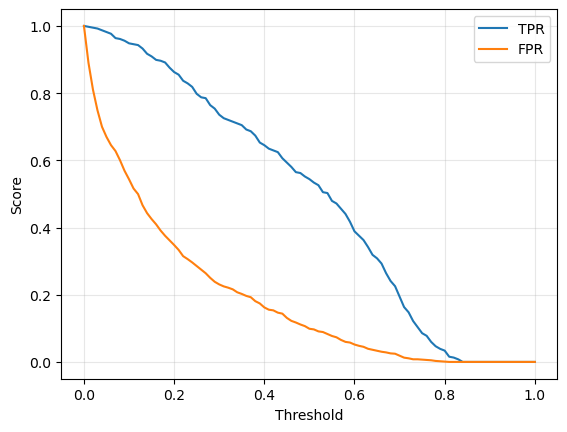

In [158]:
plt.plot(df_scores.threshold,df_scores['tpr'],label='TPR')
plt.plot(df_scores.threshold,df_scores['fpr'],label='FPR')
plt.legend() 
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.grid(True, alpha=0.3)
plt.show()

### 域值越高，召回率TPR越低，漏报率越高，FPR误报率越低

### 关键结论：两条线中间夹着的面积越大，模型区分正负样本的能力越强。如果你的业务更怕误报（比如垃圾邮件拦截），就选高阈值（右侧）；如果更怕漏报（比如疾病筛查），就选低阈值（左侧）。

### **Random model**   随机模型
#### 我们做个演示：用随机生成的预测（完全瞎猜）来和真实流失率对比，看准确率是多少。

In [159]:
np.random.seed(1)
y_rand = np.random.uniform(0, 1, size=len(y_val)) #设置随机种子为1，生成1409个在0到1之间均匀分布的随机数，赋值给y_rand，模拟模型的随机预测结果。

In [160]:
 len(y_rand)

1409

In [161]:
y_rand.round(3)

array([0.417, 0.72 , 0.   , ..., 0.774, 0.334, 0.089], shape=(1409,))

In [162]:
((y_rand >= 0.5) == y_val).mean()  # 随机数与真实值的吻合度

np.float64(0.5017743080198722)

#### **结论**，随机预测的准确率是50%。这个随机模型没有任何预测能力，相当于"抛硬币"决策。

### 做1个漏报率和误报率的函数

In [163]:
def tpr_fpr_dataframe(y_val,y_val_pred):
    scores = [] 
    thresholds = np.linspace(0,1,101)
    for t in thresholds_2:
        actual_positive = (y_val == 1)  #实际的正例
        actual_negative = (y_val == 0)  #实际的负例
    
        predict_positive = (y_val_pred >= t) #预测的正例
        predict_negative = (y_val_pred < t)  #预测的负例
    
        tp = (predict_positive & actual_positive).sum()
        fp = (predict_positive & ~actual_positive).sum()
        tn = (~predict_positive & ~actual_positive).sum()
        fn = (~predict_positive & actual_positive).sum()
    
        scores.append((t,tp,fp,fn,tn)) 
    
    columns = ['threshold','tp','fp','fn','tn']
    df_scores = pd.DataFrame(scores,columns=columns) 
    
    df_scores['tpr'] = df_scores.tp / (df_scores.tp + df_scores.fn) 
    df_scores['fpr'] = df_scores.fp / (df_scores.fp + df_scores.tn)  

    return  df_scores

In [164]:
df_rand = tpr_fpr_dataframe(y_val,y_rand)
df_rand[::10]

,threshold,tp,fp,fn,tn,tpr,fpr
0,0.0,386,1023,0,0,1.000000,1.000000
10,0.1,347,923,39,100,0.898964,0.902248
20,0.2,307,822,79,201,0.795337,0.803519
30,0.3,276,724,110,299,0.715026,0.707722
40,0.4,237,624,149,399,0.613990,0.609971
50,0.5,202,518,184,505,0.523316,0.506354
60,0.6,161,409,225,614,0.417098,0.399804
70,0.7,121,302,265,721,0.313472,0.295210
80,0.8,78,206,308,817,0.202073,0.201369
90,0.9,40,101,346,922,0.103627,0.098729


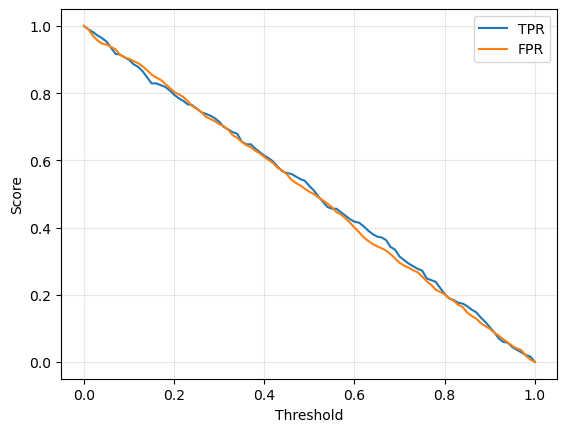

In [165]:
plt.plot(df_rand.threshold,df_rand['tpr'],label='TPR')
plt.plot(df_rand.threshold,df_rand['fpr'],label='FPR')
plt.legend() 
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.grid(True, alpha=0.3)
plt.show()

####  对于任何二分类数据集，如果采用“抛硬币”（即随机猜测）的方式，其预测结果与真实标签（y）一致的期望概率（即准确率）就是 50%。

#### 随机模型就像一个“脸盲”的保安。
#### 他不管进来的是好人（负例）还是坏人（正例），都随机放行一半、拦下一半。
#### 因为他对谁都一样，所以放走坏人的概率（漏报率 / 召回率） 和 拦住好人的概率（误报率） 是相等的（都约等于50%）。
#### 至于具体拦住了多少个好人、放走了多少个坏人，那取决于好人和坏人各来了多少个（即样本比例）。

## **Ideal model**  理想模型

In [166]:
num_neg = (y_val == 0).sum()  #统计样本数据中，y值为负例的数量，约占总数量的72.6%
num_neg

np.int64(1023)

In [167]:
num_pos = (y_val == 1).sum()  #统计样本数据中，y值为正例的数量，约占总数量的27%
num_pos

np.int64(386)

In [168]:
# 构造一个“理想化”的y值数组
y_ideal = np.repeat([0,1],[num_neg,num_pos])   # 0 重复 num_neg 次，1 重复 num_pos 次
y_ideal

array([0, 0, 0, ..., 1, 1, 1], shape=(1409,))

In [169]:
# 构造1个理想预测值
y_ideal_pred = np.linspace(0,1,len(y_val) )
y_ideal_pred                           

array([0.00000000e+00, 7.10227273e-04, 1.42045455e-03, ...,
       9.98579545e-01, 9.99289773e-01, 1.00000000e+00], shape=(1409,))

In [170]:
((y_ideal_pred >= 0.726) == y_ideal).mean() # 将阈值设置为，正例负例在样本数据中的占比分割点

np.float64(1.0)

# 理想模型演示了"完美分类器"的上限——100% 准确率。它告诉我们：在当前数据分布下，没有任何模型能超过这个值。

In [171]:
# 用上面的函数在测试一下
df_ideal = tpr_fpr_dataframe(y_ideal,y_ideal_pred)

In [172]:
df_ideal[::10]

,threshold,tp,fp,fn,tn,tpr,fpr
0,0.0,386,1023,0,0,1.000000,1.000000
10,0.1,386,882,0,141,1.000000,0.862170
20,0.2,386,741,0,282,1.000000,0.724340
30,0.3,386,600,0,423,1.000000,0.586510
40,0.4,386,459,0,564,1.000000,0.448680
50,0.5,386,319,0,704,1.000000,0.311828
60,0.6,386,178,0,845,1.000000,0.173998
70,0.7,386,37,0,986,1.000000,0.036168
80,0.8,282,0,104,1023,0.730570,0.000000
90,0.9,141,0,245,1023,0.365285,0.000000


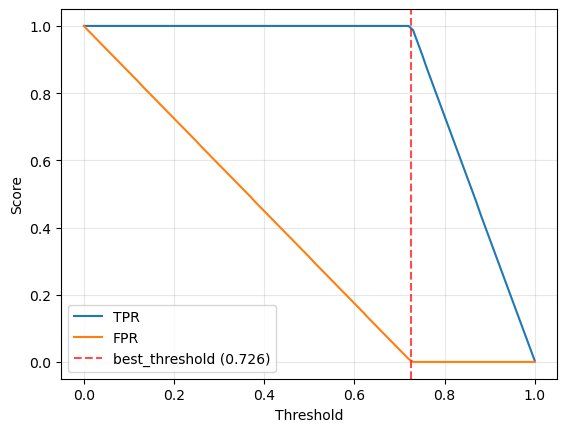

In [173]:
plt.plot(df_ideal.threshold,df_ideal['tpr'],label='TPR')
plt.plot(df_ideal.threshold,df_ideal['fpr'],label='FPR')
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.grid(True, alpha=0.3)
plt.axvline(x=0.726, color='red', linestyle='--', linewidth=1.5, alpha=0.7, label='best_threshold (0.726)')
plt.legend() 
plt.show()

## Putting everything together   将三个图整合起来

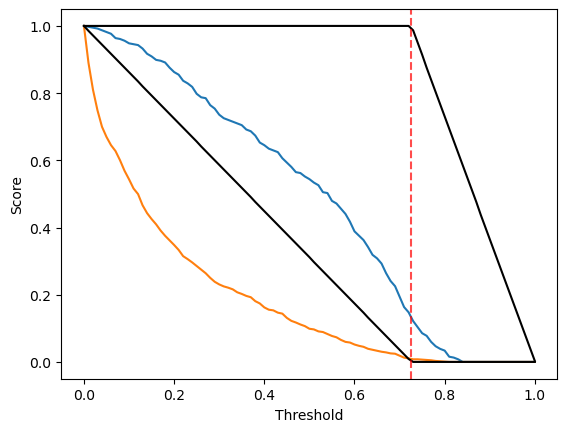

In [174]:
plt.plot(df_scores.threshold,df_scores['tpr'],label='TPR')
plt.plot(df_scores.threshold,df_scores['fpr'],label='FPR')

# plt.plot(df_rand.threshold,df_rand['tpr'],label='TPR')
# plt.plot(df_rand.threshold,df_rand['fpr'],label='FPR')

plt.plot(df_ideal.threshold,df_ideal['tpr'],label='TPR',color='black')
plt.plot(df_ideal.threshold,df_ideal['fpr'],label='FPR',color='black')
plt.xlabel('Threshold')
plt.ylabel('Score')

plt.axvline(x=0.726, color='red', linestyle='--', linewidth=1.5, alpha=0.7, label='best_threshold (0.726)')

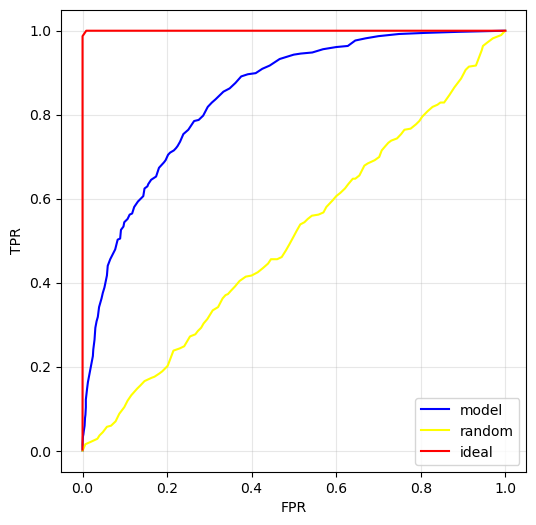

In [175]:
plt.figure(figsize=(6,6))
plt.plot(df_scores.fpr,df_scores.tpr,color='blue',label='model')     # 现实情况： 误报率越小，漏报率/召回率越大，漏报率/召回率越大,漏报越少
plt.plot(df_rand['fpr'],df_rand['tpr'],color='yellow',label='random')   # 随机情况：误报率和漏报率/召回率，一致，
plt.plot(df_ideal['fpr'],df_ideal['tpr'],color='red',label='ideal')    # 理想情况：误报率为0，漏报率/召回率100%
plt.grid(True, alpha=0.3)
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.legend() 

### 看看alexey 老师的笔记，理解一下
#### 理想模型在图中有1个交叉点，叫做**北极星**，这就是我们训练模型要达到的理想状态，被训练的模型的预测能力，不能低于随机模型的50%，那样训练模型的工作，就没有任何意义了。所以我们的目标就是让blue的模型能力的曲线，能更趋近于red 理想曲线。
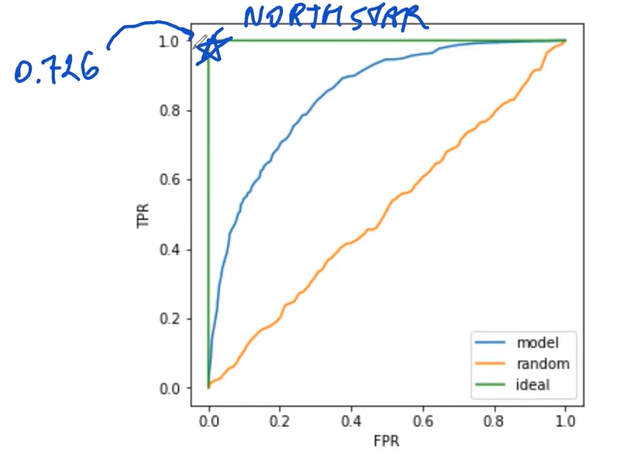
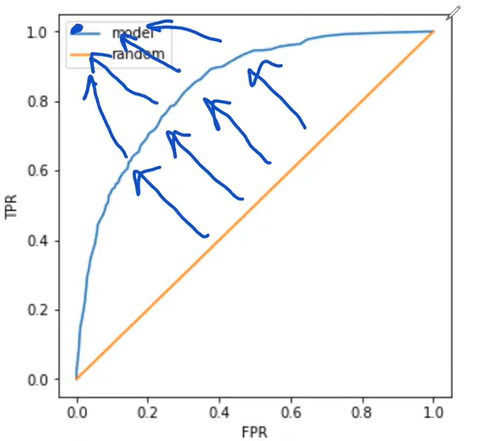

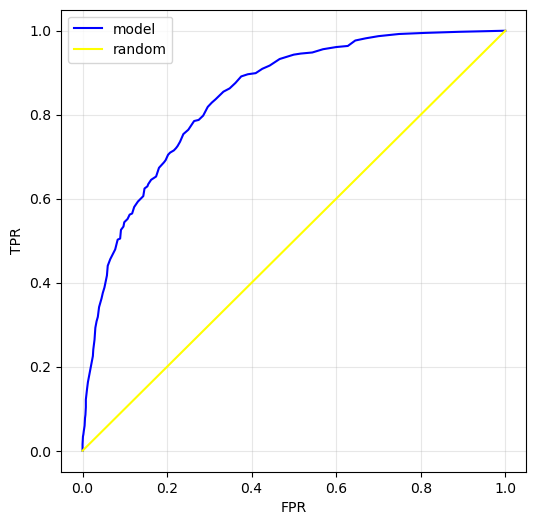

In [176]:
# 把理想曲线去掉，画一条笔直的随机曲线，作为基线。基线代表模型能力的底线，不能低于基线。
plt.figure(figsize=(6,6))
plt.plot(df_scores.fpr,df_scores.tpr,color='blue',label='model')     # 现实情况： 误报率越大，漏报率/召回率越大,漏报越少
plt.plot([0,1],[0,1],color='yellow',label='random')
#plt.plot(df_rand['fpr'],df_rand['tpr'],color='yellow',label='random')   # 随机情况：误报率和漏报率/召回率，一致，
# plt.plot(df_ideal['fpr'],df_ideal['tpr'],color='red',label='ideal')    # 理想情况：误报率为0，漏报率/召回率100%
plt.grid(True, alpha=0.3)
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.legend() 

### 看看alexey老师的总结图，非常牛！
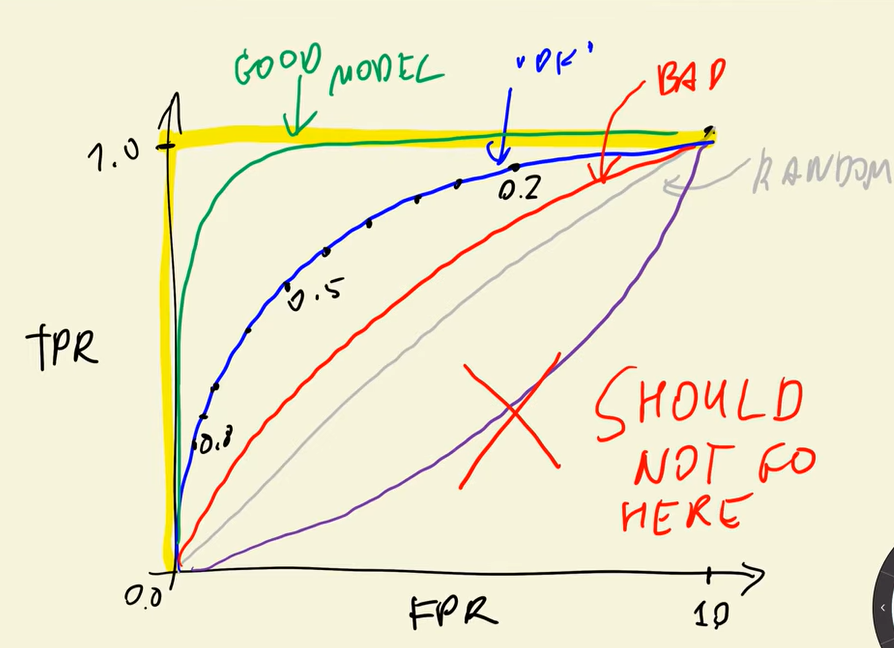

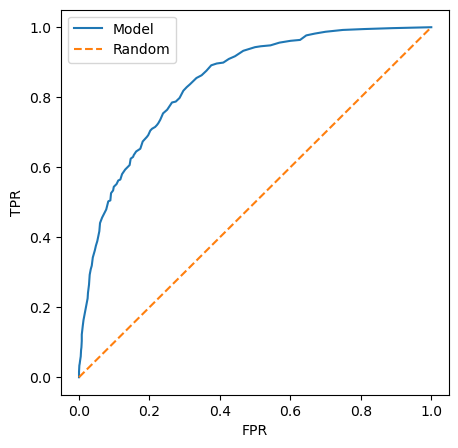

In [177]:
### 再画一个正方形的ROC curve曲线
plt.figure(figsize=(5, 5))
plt.plot (df_scores.fpr, df_scores.tpr, label='Model')
plt.plot([0, 1], [0, 1],label='Random', linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.legend()

In [178]:
### 我们用库函数来绘制同样的ROC curve
from sklearn.metrics import roc_curve

In [179]:
fpr,tpr,thresholds = roc_curve(y_val,y_val_pred)

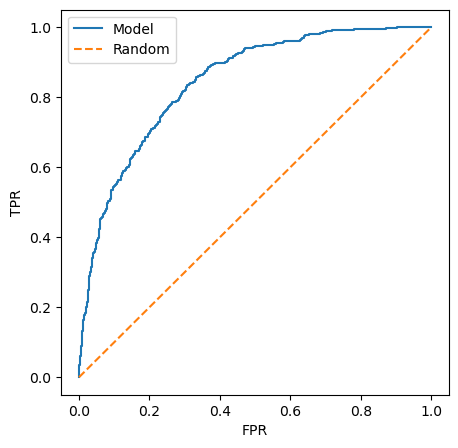

In [180]:
plt.figure(figsize=(5, 5))
plt.plot (fpr, tpr, label='Model')
plt.plot([0, 1], [0, 1],label='Random', linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.legend()

# 4.6 ROC AUC
### 引出1个模型中的概念  AUC（Area Under the Curve）
AUC（Area Under the Curve） 指的是ROC曲线下的面积，用来衡量二分类模型区分正负例的能力。
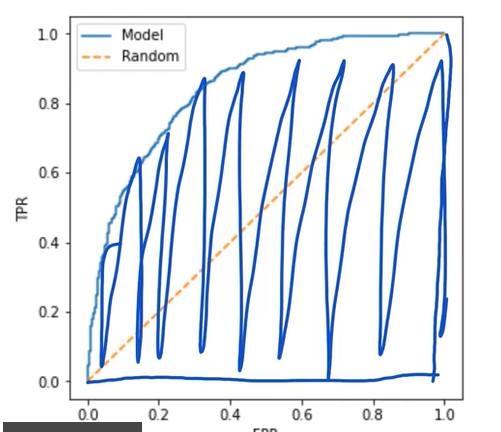

### alexey老师的这几个图，很能说明问题：
#### 黄色的阴影部分面积，就能够说明模型的能力。
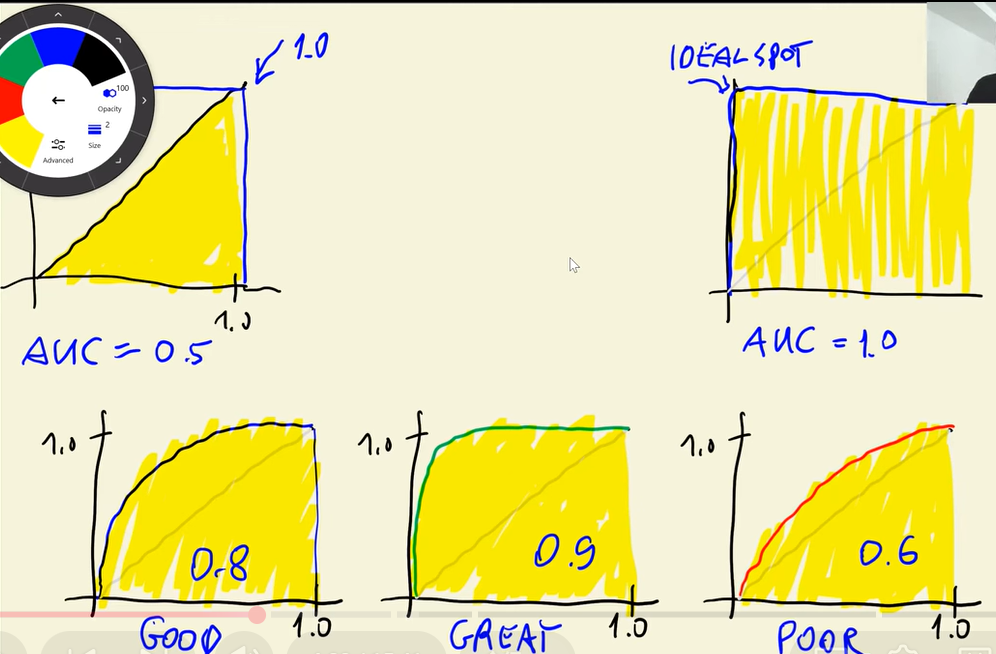

In [181]:
# 用库函数来实现AUC的计算
from sklearn.metrics  import auc
fpr,tpr,thresholds = roc_curve(y_val,y_val_pred)

In [182]:
auc(fpr,tpr)

0.8438555705812935

In [183]:
auc(df_scores.fpr,df_scores.tpr)    #这个结果和另外两个结果有差异，因为参数中的数据是数据表中的fpr和tpr

0.8436301845126849

In [184]:
auc(df_ideal.fpr,df_ideal.tpr)

0.9999430203759136

In [185]:
from  sklearn.metrics import roc_auc_score

In [186]:
roc_auc_score(y_val, y_val_pred)

0.8438555705812935

### AUC INTERPRETATION

In [187]:
neg = y_val_pred[y_val == 0]  # 取出所有预测结果的负例
pos = y_val_pred[y_val == 1]  # 取出所有预测结果的正例

In [188]:
neg

array([0.00903294, 0.20392974, 0.21156056, ..., 0.10875353, 0.31234422,
       0.13653422], shape=(1023,))

In [189]:
import random

In [190]:
pos_ind = random.randint(0,len(pos) - 1) #从模型预测为正例的样本中，随机抽取一个“幸运儿”样本
pos_ind  # 抽取的是索引

157

In [191]:
neg_ind = random.randint(0,len(neg) - 1)
neg_ind

762

In [192]:
# 用蒙特卡洛（随机模拟）方法，计算模型的 AUC,得到的结果与前面AUC的函数，几乎相同
# 通过 100000 次随机抽样，统计“随机一个正例的预测分数 > 随机一个负例的预测分数”的概率，这个概率就是 AUC 的数学定义。
n = 100000
success = 0
for i in range(n):
    pos_ind = random.randint(0,len(pos) - 1)
    neg_ind = random.randint(0,len(neg) - 1)
    if pos[pos_ind] > neg[neg_ind]:
        success = success + 1
        
success / n

0.84252

#### ***强烈推荐*** 用下面这个方法，计算AUC

In [193]:
# 用向量化（无循环）的方式，通过 50000 次随机抽样，计算 AUC——即“随机一个正例的预测分数 > 随机一个负例的预测分数”的概率。
n = 50000
np.random.seed(1)
pos_ind = np.random.randint(0, len(pos), size=n)
neg_ind = np.random.randint(0, len(neg), size=n)
(pos[pos_ind] > neg[neg_ind]).mean()

np.float64(0.84646)

#### 先自己总结一下，要不学的有点晕了：
1. 什么时候看“准确率（Accuracy）
- 前提：当你的数据集中，正负样本数量差不多（均衡）时，准确率非常有效。
- 定义：（猜对的样本数）/（总样本数）。
- 优点：非常直观，符合人类常识。“10个预测对了9个，就是90%正确”。
- 致命缺陷（你的数据中招了）：你的数据 72%是负例，28%是正例（不均衡）。
- 案例：如果模型把所有样本都预测成“负例”（躺平），它的准确率依然有 72%！但这模型毫无用处，因为它一个正例都没找出来。
2. 什么时候看“AUC”？（数据科学家/真实业务最信赖）
- 前提：只要你的数据正负例不均衡（就像你现在 28% vs 72%），或者你想看模型在所有可能的切割点下的综合表现，就必须看 AUC。
- 定义：随机抽一个正例，它的分数比随机抽一个负例高的概率。
- 优点：不受“阈值（0.5）”的绑架。它不管你定 0.5 还是 0.7，它看的是模型的“排序能力”。
3. 作为模型研发者（评估模型好坏）：AUC 是绝对的标准！
- 如果 AUC = 0.5，直接放弃这个模型（等于瞎猜）。
- 如果 AUC = 0.65~0.7，算“勉强能用”。
- 如果 AUC > 0.8，算“良好”。
- 如果 AUC > 0.9，算“优秀”。

# 4.7  Cross-Validation
参数调优，选择最佳参数的过程。

### 先看fold  
from sklearn.model_selection import KFold
这个库就是用来实现对df_full_train ,进行再次划分多组，训练集和验证集的
先看看aelexy老师，对于利用KFold，将df_full_train 进行划分的讲解
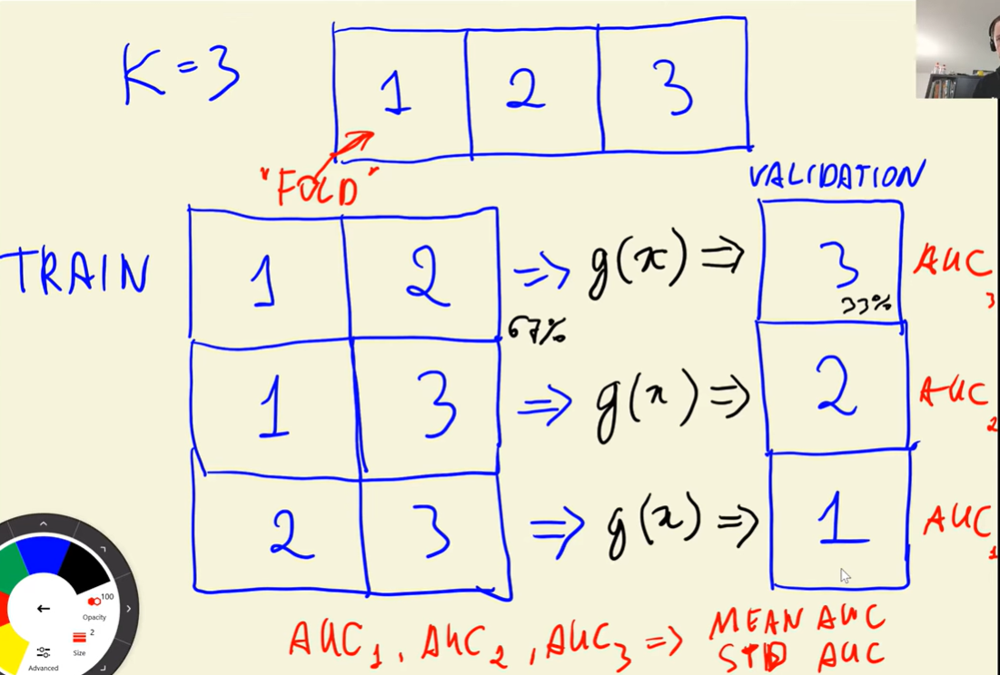

#### 以上讲解：将1个df_full_train  ，利用KFold 的划分了3段，共有3种训练集和验证集的组合，
#### 分别会产生三组AUC，最终可以计算AUC的平均值和标准差
#### 同时对逻辑回归函数LogisticRegression的参数C，进行配置，
#### # C=1.0  作用：正则化强度的倒数。默认值，平衡状态	一般是合理的起点
#### # solver='liblinear'   作用：选择用于训练模型的优化算法。小数据集、二分类	速度快，支持L1/L2正则化，但不能处理多分类（ovr）,对二分类问题效果很好
#### # max_iter=1000  作用：优化算法最大迭代次数。

In [258]:
# 先创建1个函数，实现1个完整的训练流程
def train(df_train, y_train,C=1.0):
    dicts = df_train[categorical + numerical].to_dict(orient='records')
    dv = DictVectorizer(sparse=False)
    X_train = dv.fit_transform(dicts)
    model = LogisticRegression(C=C,solver='liblinear',max_iter=1000)
    model.fit(X_train, y_train)
    
    return dv, model

In [259]:
dv,model = train(df_train,y_train)

In [260]:
#  创建1个预测函数
def predict(df_train, dv, model):
    dicts = df_train[categorical + numerical].to_dict(orient='records')
    X = dv.transform(dicts)
    y_pred = model.predict_proba(X)[:,1]
    return y_pred 

In [261]:
y_pred = predict(df_val, dv, model)

In [262]:
from sklearn.model_selection import KFold 

In [263]:
kfold = KFold(n_splits=10, shuffle=True, random_state=1)  
# 实例化KFold类，配置参数，划分9个训练集和1个验证集的10个片段，打乱索引，随机1

In [264]:
# 将df_full_train的值传入kfold函数，从 KFold 分割器中取出第一组训练/验证索引
train_idx,val_idx = next( kfold.split(df_full_train))

In [265]:
len(train_idx)

5070

In [266]:
len(val_idx)

564

In [267]:
len(df_full_train)

5634

In [268]:
df_train = df_full_train.iloc[train_idx]
df_train

,customerid,gender,seniorcitizen,partner,dependents,tenure,phoneservice,multiplelines,internetservice,onlinesecurity,...,deviceprotection,techsupport,streamingtv,streamingmovies,contract,paperlessbilling,paymentmethod,monthlycharges,totalcharges,churn
0,5442-pptjy,male,0,yes,yes,12,yes,no,no,no_internet_service,...,no_internet_service,no_internet_service,no_internet_service,no_internet_service,two_year,no,mailed_check,19.70,258.35,0
1,6261-rcvns,female,0,no,no,42,yes,no,dsl,yes,...,yes,yes,no,yes,one_year,no,credit_card_(automatic),73.90,3160.55,1
2,2176-osjuv,male,0,yes,no,71,yes,yes,dsl,yes,...,no,yes,no,no,two_year,no,bank_transfer_(automatic),65.15,4681.75,0
3,6161-erdgd,male,0,yes,yes,71,yes,yes,dsl,yes,...,yes,yes,yes,yes,one_year,no,electronic_check,85.45,6300.85,0
5,4765-oxppd,female,0,yes,yes,9,yes,no,dsl,yes,...,yes,yes,no,no,month-to-month,no,mailed_check,65.00,663.05,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5628,2250-ivbwa,male,0,yes,yes,64,yes,no,fiber_optic,yes,...,no,no,no,no,month-to-month,no,electronic_check,81.05,5135.35,0
5630,3507-gasnp,male,0,no,yes,60,yes,no,no,no_internet_service,...,no_internet_service,no_internet_service,no_internet_service,no_internet_service,two_year,no,mailed_check,19.95,1189.90,0
5631,8868-wozgu,male,0,no,no,28,yes,yes,fiber_optic,no,...,yes,no,yes,yes,month-to-month,yes,electronic_check,105.70,2979.50,1
5632,1251-krreg,male,0,no,no,2,yes,yes,dsl,no,...,no,no,no,no,month-to-month,yes,mailed_check,54.40,114.10,1


In [269]:
df_val =  df_full_train.iloc[val_idx]
df_val

,customerid,gender,seniorcitizen,partner,dependents,tenure,phoneservice,multiplelines,internetservice,onlinesecurity,...,deviceprotection,techsupport,streamingtv,streamingmovies,contract,paperlessbilling,paymentmethod,monthlycharges,totalcharges,churn
4,2364-ufrom,male,0,no,no,30,yes,no,dsl,yes,...,no,yes,yes,no,one_year,no,electronic_check,70.40,2044.75,0
21,2346-czyil,male,0,no,no,27,yes,no,no,no_internet_service,...,no_internet_service,no_internet_service,no_internet_service,no_internet_service,two_year,no,credit_card_(automatic),20.35,531.60,0
28,1090-pykci,female,0,yes,yes,69,yes,yes,fiber_optic,yes,...,yes,yes,yes,no,one_year,yes,credit_card_(automatic),105.10,7234.80,0
33,8999-ypybv,male,0,yes,yes,45,yes,no,dsl,yes,...,yes,yes,yes,yes,two_year,yes,mailed_check,84.35,3858.05,0
44,5092-stpkp,female,0,no,no,24,yes,no,dsl,yes,...,no,yes,no,no,month-to-month,no,credit_card_(automatic),56.35,1381.20,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5601,7337-cinud,female,0,yes,yes,8,yes,no,no,no_internet_service,...,no_internet_service,no_internet_service,no_internet_service,no_internet_service,two_year,no,bank_transfer_(automatic),19.50,159.35,0
5610,3701-sfmuh,male,0,yes,yes,7,yes,no,dsl,yes,...,no,no,yes,yes,month-to-month,no,credit_card_(automatic),69.70,516.15,0
5616,3237-ajgeh,female,0,yes,yes,3,no,no_phone_service,dsl,no,...,no,yes,no,no,month-to-month,yes,mailed_check,31.00,95.05,1
5626,3262-eidhv,female,0,yes,yes,72,yes,yes,dsl,yes,...,yes,yes,yes,yes,two_year,no,credit_card_(automatic),84.70,5893.90,0


In [270]:
# 通常，我们利用循环去做上面的这几步操作
n_splits = 5
for C in [0.001,0.01,0.1,0.5,1,5,10]:
    scores = []

    kfold = KFold(n_splits=n_splits, shuffle=True, random_state=1)
    
    for train_idx,val_idx in kfold.split(df_full_train):
        df_train = df_full_train.iloc[train_idx]
        df_val =  df_full_train.iloc[val_idx]
        y_train = df_train.churn.values
        y_val = df_val.churn.values
        
        dv,model = train(df_train, y_train ,C=C) 
        y_pred = predict(df_val,dv,model)
        auc =  roc_auc_score(y_val,y_pred)
        scores.append(auc)
    print('%s %.3f +- %.3f' % (C, np.mean(scores), np.std(scores)))

0.001 0.825 +- 0.013
0.01 0.839 +- 0.009
0.1 0.841 +- 0.007
0.5 0.841 +- 0.007
1 0.841 +- 0.007
5 0.841 +- 0.007
10 0.841 +- 0.007


In [275]:
scores

[0.8422062783085147,
 0.8452171070056945,
 0.8338310254866547,
 0.8322708160133018,
 0.8522167487684729]

In [274]:
#  训练最终模型,用测试数据集来验证模型性能
dv,model = train(df_full_train, df_full_train.churn.values ,C=1) 
y_pred = predict(df_test,dv,model)
auc =  roc_auc_score(y_test,y_pred)
auc

0.8579400803839363

### 发现，最佳 CV的 AUC	0.841 ± 0.007	良好，稳定
### 1. 选均值最高的，2. 如果并列，选标准差最小的（最稳定），3. 如果还并列，选最小的 C（最简洁）
### 训练最终模型：测试集中，AUC结果，比交叉验证中的ACU提升了，微小的提升。
### 0.8579 - 0.841 = 0.0169
## 结论：模型训练成功！可以部署
## 交叉验证（CV）结果 ≈ 测试集结果
##    ↓
## 说明模型没有过拟合，泛化能力强
##    ↓
## 模型训练得“好”了

# 4.8  Summary 
- Metric - a single number that describes the performance of a model
- Accuracy fraction of correct answers; sometimes misleading
- Precision and recall are less misleading when we have class inbalance
- ROC Curve - a way to evaluate the performance at all thresholds; okay to use with imbalance
- K-Fold CV - more reliable estimate for performance (mean + std)
- 指标：用于描述模型性能的单一数值  
- 准确率：正确答案的比例；有时容易产生误导  
- 精确率和召回率在类别不平衡时相对更不容易产生误导  
- ROC曲线：评估所有阈值下性能的方法；适用于不平衡数据集  
- K-Fold 折交叉验证：对性能估计更可靠（均值 + 标准差）